# Applied ML - Regression, Classification and Custering

# Project 1

## Question 1

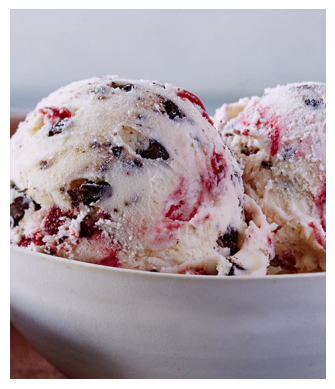

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open('/anvil/projects/tdm/data/icecream/hd/images/0_hd.png')

plt.imshow(image)
plt.axis('off')
plt.show()

In [3]:
import numpy as np

# Convert the image to a numpy array
image_array = np.array(image)

# Get the dimensions of the image
height, width, channels = image_array.shape

print(f"Image dimensions: {height}x{width}x{channels}")

Image dimensions: 552x471x3


Image dimensions: 552x471x3

## Question 2

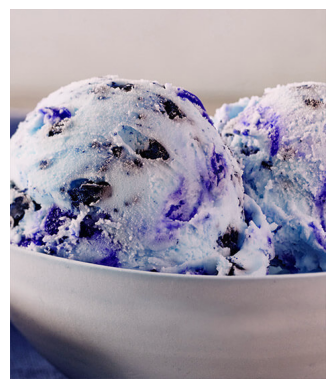

In [4]:
import cv2

# Load an image using cv2.imread()
image_opencv = cv2.imread('/anvil/projects/tdm/data/icecream/hd/images/0_hd.png')
plt.imshow(image_opencv)
plt.axis('off')
plt.show()

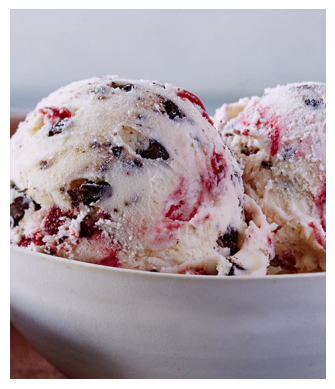

In [5]:
# Swap the red and blue channels of the image array using numpy indexing
image_blue = image_opencv[:, :, 0].copy()
image_green = image_opencv[:, :, 1].copy()
image_red = image_opencv[:, :, 2].copy()

image_rgb = np.stack([image_red, image_green, image_blue], axis=-1)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

## Question 3

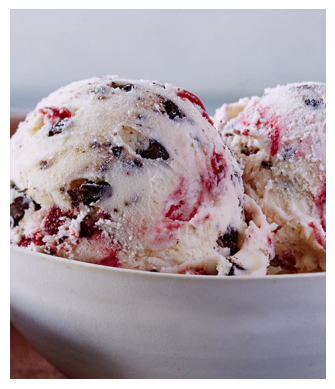

In [6]:
# Convert the image from BGR to RGB using cv2.cvtColor()
image_rgb_opencv = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2RGB)

# Display the converted image using matplotlib
plt.imshow(image_rgb_opencv)
plt.axis('off')
plt.show()

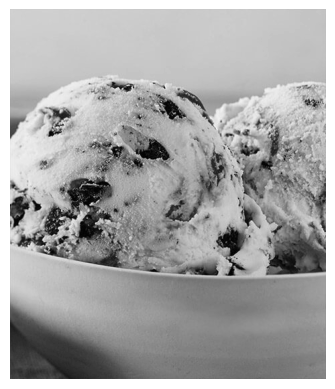

In [7]:
# Convert the image from BGR to grayscale using cv2.cvtColor()
image_gray_opencv = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2GRAY)

# Display the converted image using matplotlib
plt.imshow(image_gray_opencv, cmap='gray')
plt.axis('off')
plt.show()

## Question 4

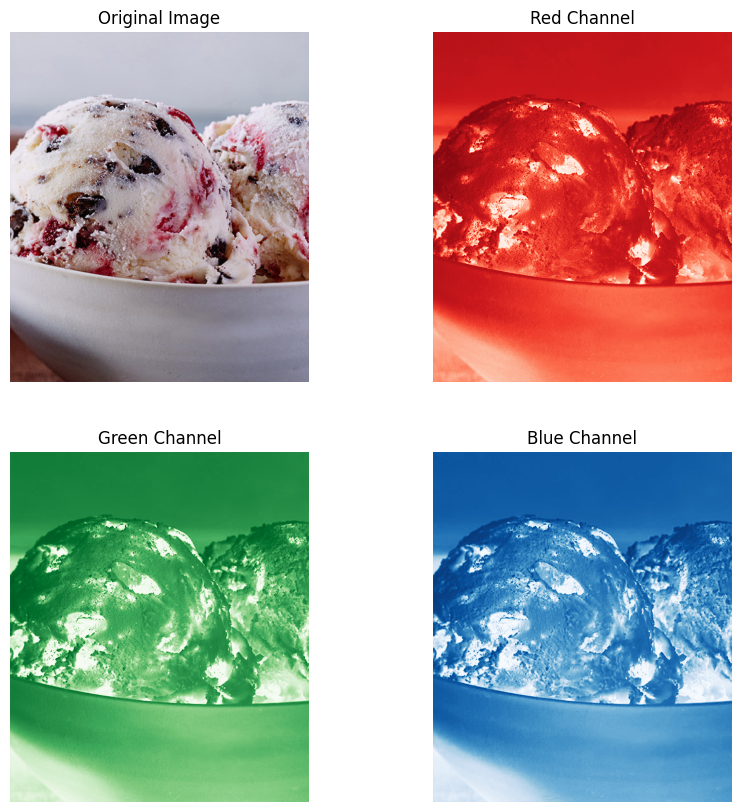

In [8]:
# Split the image into its individual color channels using cv2.split()
image_blue_opencv, image_green_opencv, image_red_opencv = cv2.split(image_opencv)

# Display the original image and individual color channels using matplotlib in a 2x2 grid

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(image_rgb_opencv)
plt.axis('off')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(image_red_opencv, cmap='Reds')
plt.axis('off')
plt.title('Red Channel')

plt.subplot(2, 2, 3)
plt.imshow(image_green_opencv, cmap='Greens')
plt.axis('off')
plt.title('Green Channel')

plt.subplot(2, 2, 4)
plt.imshow(image_blue_opencv, cmap='Blues')
plt.axis('off')
plt.title('Blue Channel')

plt.show()

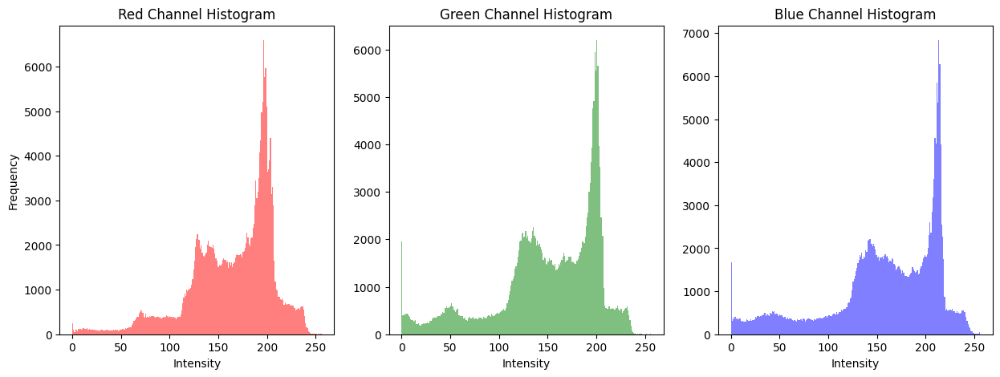

In [9]:
# Plot the histograms of the individual color channels

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(image_red_opencv.ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.title('Red Channel Histogram')
plt.xlabel('Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(image_green_opencv.ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.title('Green Channel Histogram')
plt.xlabel('Intensity')

plt.subplot(1, 3, 3)
plt.hist(image_blue_opencv.ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.title('Blue Channel Histogram')
plt.xlabel('Intensity')

plt.show()

A similarity I noticed in these histograms is that the Red, Blue, and Green channels all peak in the 180-220 range while also following a similar pattern. This indicates that many pixels in the image have that particular intensity value for each color channel. It represents the bright regions in the image (the white color of the ice cream and the white bowl), which have a high overall brightness across all channels.

A difference that I noticed is there is a spike at the beginning of all 3 colors that varies in frequency. These are the darker areas in the picture. The red's spike is the lowest because the ice cream's raspberry swirls part is already red. So there is less 'darkness' in the Red channel compared to other colors.

## Question 5

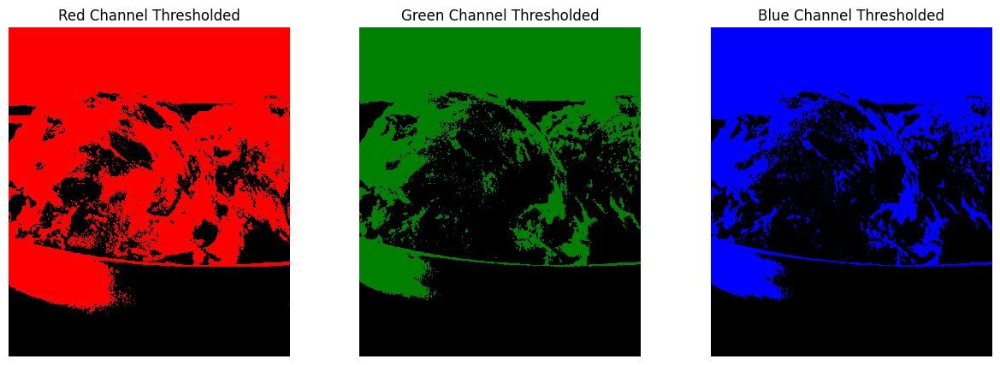

In [21]:
from matplotlib.colors import ListedColormap

red_threshold = 160
green_threshold = 175
blue_threshold = 180

# Threshold the individual color channels using cv2.threshold()
_, image_red_thresholded = cv2.threshold(image_red_opencv, red_threshold, 255, cv2.THRESH_BINARY)
_, image_green_thresholded = cv2.threshold(image_green_opencv, green_threshold, 255, cv2.THRESH_BINARY)
_, image_blue_thresholded = cv2.threshold(image_blue_opencv, blue_threshold, 255, cv2.THRESH_BINARY)


# Display the final binary image and the individual thresholded color channels
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_red_thresholded, cmap=ListedColormap(['black','red']))
plt.title('Red Channel Thresholded')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image_green_thresholded, cmap=ListedColormap(['black','green']))
plt.title('Green Channel Thresholded')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image_blue_thresholded, cmap=ListedColormap(['black','blue']))
plt.title('Blue Channel Thresholded')
plt.axis('off')
plt.show()

The red channel histogram shows distinct peaks around 130 and 190. I chose 160 as it lies between these peaks so that it would separate the darker regions (background and shadows) from the brighter regions. The same logic applies to green and blue as green's peaks are around 140 and 200 and blue's are around 150 and 220. I chose a middle number for all the color channels.

# Project 2

## Question 1

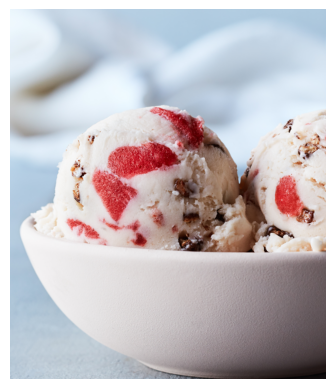

In [1]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

image_opencv = cv2.imread('/anvil/projects/tdm/data/icecream/hd/images/56_hd.png')
image_rgb = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

In [2]:
height, width, channels = image_opencv.shape
print(f"Image dimensions: {height}x{width}x{channels}")

Image dimensions: 633x540x3


Image dimensions: 633x540x3

OpenCV loads images in BGR format and Matplotlib expects images in RGB format. So I converted the color of the picture from BGR to RGB by using the cvtColor function. 

## Question 2

In [3]:
def crop_image(image, top_left_coordinates, bottom_right_coordinates):

    cropped_image = image[top_left_coordinates[1]:bottom_right_coordinates[1], top_left_coordinates[0]:bottom_right_coordinates[0]]

    return cropped_image

(-0.5, 149.5, 34.5, -0.5)

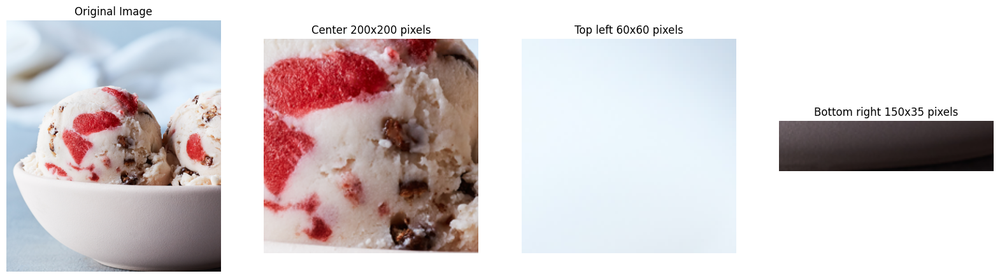

In [4]:
cropped_image1 = crop_image(image_rgb, (170, 217), (370, 417))
cropped_image2 = crop_image(image_rgb, (0, 0), (60, 60))
cropped_image3 = crop_image(image_rgb, (390, 598), (540, 633))

fig, ax = plt.subplots(1, 4, figsize=(20, 20))

ax[0].imshow(image_rgb)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(cropped_image1)
ax[1].set_title('Center 200x200 pixels')
ax[1].axis('off')

ax[2].imshow(cropped_image2)
ax[2].set_title('Top left 60x60 pixels')
ax[2].axis('off')

ax[3].imshow(cropped_image3)
ax[3].set_title('Bottom right 150x35 pixels')
ax[3].axis('off')

I think the center of the image would be more useful in image classification cause it is the only image that contains the ice cream itself, and the classifier will be able to learn the correct features of ice cream instead of the background in the other cropped images.

## Question 3

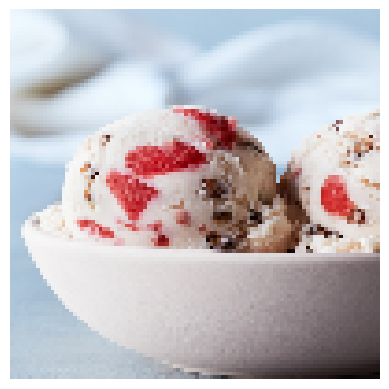

In [5]:
resized_image = cv2.resize(image_rgb, (100, 100), interpolation=cv2.INTER_LINEAR)

plt.imshow(resized_image)
plt.axis('off')
plt.show()

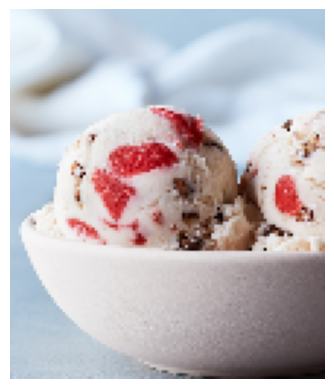

In [6]:
resized_image_aspect = cv2.resize(image_rgb, (0, 0), fx=0.2, fy=0.2, interpolation=cv2.INTER_LINEAR)

plt.imshow(resized_image_aspect)
plt.axis('off')
plt.show()

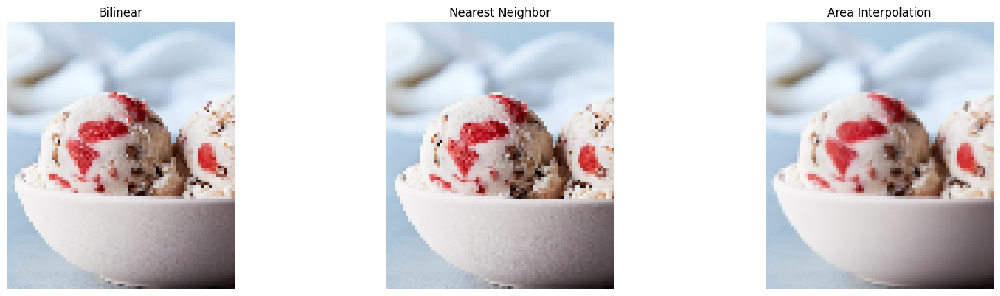

In [16]:
resized_bilinear = cv2.resize(image_rgb, (0, 0), fx=0.15, fy=0.15, interpolation=cv2.INTER_LINEAR)
resized_nearest = cv2.resize(image_rgb, (0, 0), fx=0.15, fy=0.15, interpolation=cv2.INTER_NEAREST)
resized_area = cv2.resize(image_rgb, (0, 0), fx=0.15, fy=0.15, interpolation=cv2.INTER_AREA)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].imshow(resized_bilinear)
axes[0].set_title("Bilinear")
axes[0].axis("off")

axes[1].imshow(resized_nearest)
axes[1].set_title("Nearest Neighbor")
axes[1].axis("off")

axes[2].imshow(resized_area)
axes[2].set_title("Area Interpolation")
axes[2].axis("off")

plt.show()

The area interpolation method produces the best result as it has less pixelation and has more detail compared to the other methods. Both Bilinear interpolation and nearest neighbor has significant pixelation. Although all resized images appear somewhat blurry due to downsampling, area interpolation shows the clearest and most visually balanced result.

## Question 4

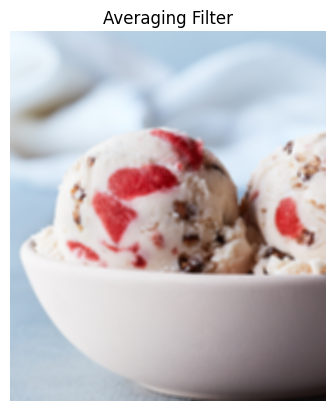

In [13]:
kernel = np.ones((7, 7), np.float32) / 49

filtered_image = cv2.filter2D(image_rgb, -1, kernel)

plt.imshow(filtered_image)
plt.title('Averaging Filter')
plt.axis('off')
plt.show()

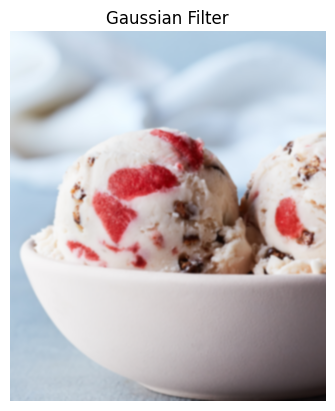

In [14]:
filtered_image_gaussian = cv2.GaussianBlur(image_rgb, (7, 7), 0)

plt.imshow(filtered_image_gaussian)
plt.title('Gaussian Filter')
plt.axis('off')
plt.show()

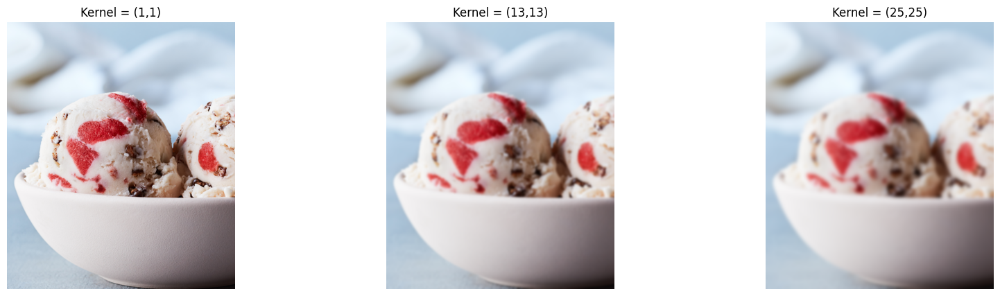

In [32]:
filtered_gaussian_1 = cv2.GaussianBlur(image_rgb, (1, 1), 0)
filtered_gaussian_2 = cv2.GaussianBlur(image_rgb, (13, 13), 0)
filtered_gaussian_3 = cv2.GaussianBlur(image_rgb, (25, 25), 0)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].imshow(filtered_gaussian_1)
axes[0].set_title("Kernel = (1,1)")
axes[0].axis("off")

axes[1].imshow(filtered_gaussian_2)
axes[1].set_title("Kernel = (13,13)")
axes[1].axis("off")

axes[2].imshow(filtered_gaussian_3)
axes[2].set_title("Kernel = (25,25)")
axes[2].axis("off")

plt.show()

When the kernel size decreases and the blurriness of the image also decreases. Large kernels shows a strong blurring. This is because choosing a large kernel means more pixels are being contributed to the averaging, resulting in a smoother, more blurred effect.

## Question 5

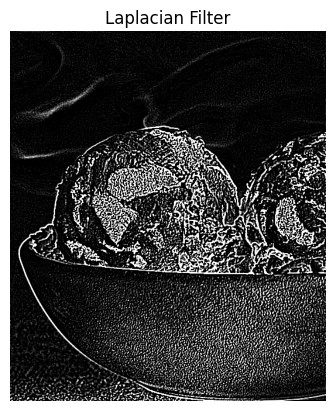

In [48]:
grayscale_image = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)
filtered_image_laplacian = cv2.Laplacian(grayscale_image, cv2.CV_8U, ksize=5)

plt.imshow(filtered_image_laplacian, cmap='gray')
plt.title('Laplacian Filter')
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


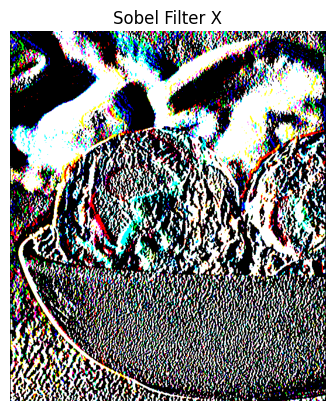

In [49]:
filtered_image_sobel_x = cv2.Sobel(image_rgb, cv2.CV_32F, 1, 0, ksize=5)

plt.imshow(filtered_image_sobel_x)
plt.title('Sobel Filter X')
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


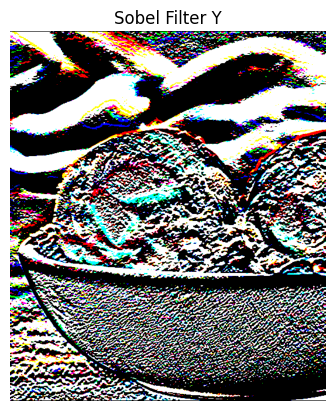

In [50]:
filtered_image_sobel_y = cv2.Sobel(image_rgb, cv2.CV_32F, 0, 1, ksize=5)

plt.imshow(filtered_image_sobel_y)
plt.title('Sobel Filter Y')
plt.axis('off')
plt.show()

In the Sobel filter of X direction, the vertical edges in the image have become more bold. This is because it detects changes in intensity along the horizontal axis, so edges aligned vertically appear more pronounced. In the Y direction, the horizontolly alinged edges in the image is bolder. It detects the horizontal edges by capturing intensity variations along the vertical axis. Thus, making horizontal edges more pronounced.

# Project 3

## Question 1

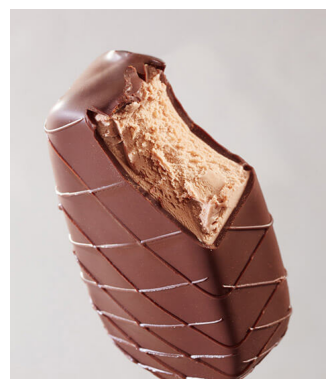

In [1]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

image_opencv = cv2.imread('/anvil/projects/tdm/data/icecream/hd/images/13_hd.png')
image_rgb = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

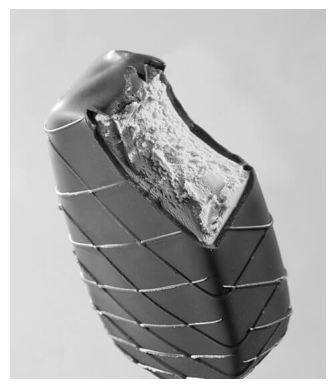

In [2]:
image_gray = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2GRAY)

plt.imshow(image_gray, cmap='gray')
plt.axis('off')
plt.show()

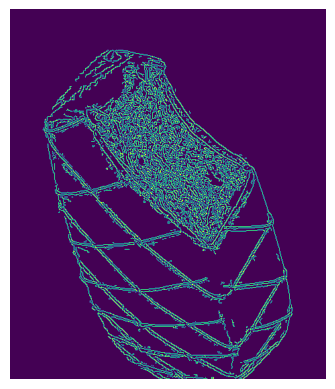

In [3]:
image_canny = cv2.Canny(image_opencv, 50, 100, 3)

plt.imshow(image_canny)
plt.axis('off')
plt.show()

I think it most accurately defines the edges of the picture. After reading the documentation, from my undrstanding the low threshold sets the minimum value which will be set as the non edges and the maximum value are set to sure to be edges. The edges that lies in between are categorized as non edges or sure adges by the connectivity to the "sure to be edges" pixels. Otherwise they are discarded. When i set both the threshold almost the entire picture has edges and when i set it to high, there are only few edges.

In Project 1 Q5, we seperated the image into RGB where the pictures were contrasted based on each colors threshold. Here we have a binary image that shows the edge structures in the image instead of color features.

## Question 2

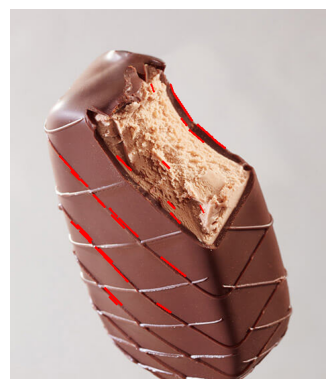

In [4]:
lines = cv2.HoughLinesP(image_canny, 1, np.pi/180, 80, 50, 10)
image_with_lines = image_rgb.copy()

if lines is not None:
    for line in lines:
        x0, y0, x1, y1 = line[0]
        cv2.line(image_with_lines, (x0, y0), (x1, y1), (255, 0, 0), 2)  

plt.imshow(image_with_lines)
plt.axis("off")
plt.show()

When I set it to a lower value, it detected more lines, but there were also lots of noise. Setting it to a higher value detected only the most prominent lines. So I set it to 80 as it gave importance to the prominent lines in the ice cream more accurately.

I noticed that that shorter minLineLength detects fragmented lines. Longer values detect only more prominent, continuous lines. I set it to 50 to detect reasonably long structures without picking up every minor edge. Lower maxLineGap result in fragmented lines. Higher values merge closely spaced segments. I set it to 10, allowing some small gaps between broken lines while maintaining accuracy.

## Question 3

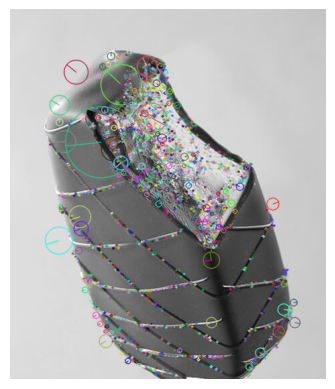

In [5]:
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(image_gray, None)

image_sift = cv2.drawKeypoints(image_gray, keypoints, image_rgb, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.imshow(image_sift)
plt.axis("off")
plt.show()

Keypoints were mostly on around the edges, textures, and corners in the image. Flat and smooth areas of the picture have fewer or no keypoints because they lack distinct features.

Yes. It looks like the direction is determined by the gradient or the change in pixel intensity around that point. It looks like the keypoints are following the contour of the curve, and their gradient directions points perpendicular to the edge which makes it looks like its pointing outwards from the ice cream.

## Question 4

In [6]:
matching_image1 = cv2.resize(image_gray, (0,0), fx=1.6, fy=1.6)
matching_image2 = cv2.rotate(image_gray, cv2.ROTATE_90_CLOCKWISE)

In [7]:
sift = cv2.SIFT_create()

In [8]:
keypoints1, descriptors1 = sift.detectAndCompute(matching_image1, None)
keypoints2, descriptors2 = sift.detectAndCompute(matching_image2, None)

In [9]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

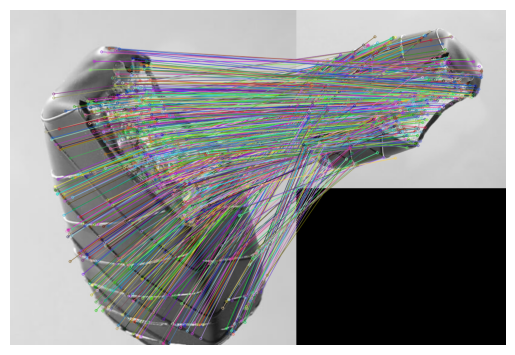

In [10]:
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append([m])

matched_image = cv2.drawMatchesKnn(matching_image1, keypoints1, matching_image2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(matched_image, cmap='gray')
plt.axis("off")
plt.show()

Most features matched correctly, but not all of them. I believe some of the incorrect matches are due to background noise and the repeated patterns in the ice cream picture. I also believe there are few some weak matches that occured at places where the features are not distinct enough.

## Question 5

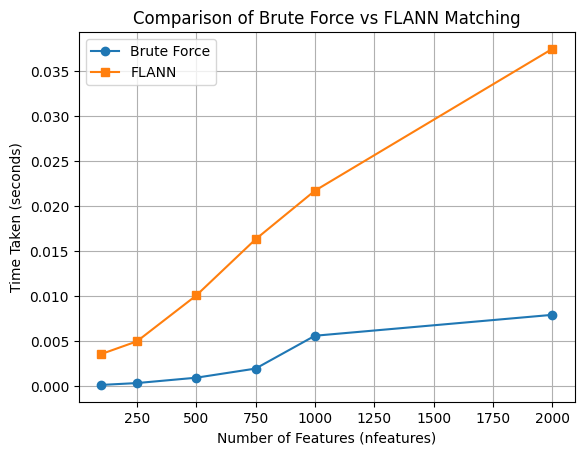

In [13]:
import time

nfeatures_list = [100, 250, 500, 750, 1000, 2000]

brute_force_times = []
flann_times = []

for nfeatures in nfeatures_list:
    sift = cv2.SIFT_create(nfeatures=nfeatures)

    keypoints1, descriptors1 = sift.detectAndCompute(matching_image1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(matching_image2, None)

    bf = cv2.BFMatcher()
    start_time = time.time()
    matches_bf = bf.knnMatch(descriptors1, descriptors2, k=2)
    bf_time = time.time() - start_time

    index_params = dict(algorithm=1, trees=5) 
    search_params = dict(checks=50)  
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    start_time = time.time()
    matches_flann = flann.knnMatch(descriptors1, descriptors2, k=2)
    flann_time = time.time() - start_time

    brute_force_times.append(bf_time)
    flann_times.append(flann_time)

plt.plot(nfeatures_list, brute_force_times, marker='o', label="Brute Force")
plt.plot(nfeatures_list, flann_times, marker='s', label="FLANN")
plt.xlabel("Number of Features (nfeatures)")
plt.ylabel("Time Taken (seconds)")
plt.title("Comparison of Brute Force vs FLANN Matching")
plt.legend()
plt.grid(True)
plt.show()

FLANN is slower than Brute Force for small feature sets. This happens because, for smaller datasets, the overhead of building the FLANN tree outweighs the benefits of fast searching. FLANN also scales much worse than Brute Force. As nfeatures increases, FLANN takes significantly more time compared to Brute Force. FLANN's complex tree structure leads to increased computational cost as features increase. Additionally, Brute Force scales more efficiently. Brute Force grows linearly with the number of features. FLANN grows at a much higher rate, making it inefficient for large datasets.

For Brute Force, when the nfeatures increases, the time increases linearly. As for FLANN, as nfeatures increases, the time increases exponentially. At large nfeatures (1000+), FLANN is significantly slower. Id say for real time applications, Brute Force is way better than FLANNsince it is fast and scales predictably.

# Project 4

## Question 1

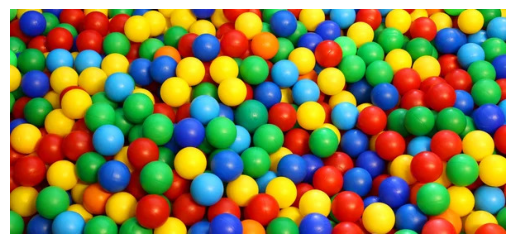

In [1]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

image_opencv = cv2.imread('/anvil/projects/tdm/data//images/ballpit.jpg')
image_opencv = cv2.cvtColor(image_opencv, cv2.COLOR_BGR2RGB)
plt.imshow(image_opencv)
plt.axis('off')
plt.show()

In [2]:
image_dimensions_changed = image_opencv.reshape((-1, 3))
image_dimensions_changed = np.float32(image_dimensions_changed)

In [3]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 0.1)

In [4]:
def apply_kmeans(K):
    compactness, labels, centers = cv2.kmeans(image_dimensions_changed, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers) # cast to uint8, or 0-255 values
    segmented_image = centers[labels.flatten()] # get the centers for each pixel
    segmented_image = segmented_image.reshape(image_opencv.shape) # reshape the image back to the original shape
    
    return segmented_image

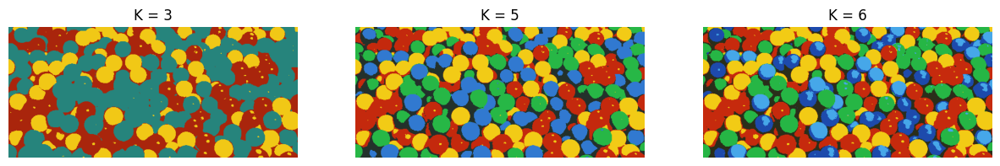

In [5]:
k_values = [3, 5, 6]
fig, axes = plt.subplots(1, len(k_values), figsize=(15, 5))

for i, k in enumerate(k_values):
    segmented_img = apply_kmeans(k)
    axes[i].imshow(segmented_img)
    axes[i].set_title(f'K = {k}')
    axes[i].axis('off')

plt.show()

In K=3, the image is divideed into only 3 colors and it looks like the colors of the balls are merging with each other, leading to the ball not having a definite shape. For K=5, there are more colors now than the K=3, and the colors are not merging anymore. But it looks like some shadows are casted on the place of balls. On the K=6 image, the colrs of the balls are defined better. But it looks like there some are issues with lighting and the shadows on this. So as K increases, the colors captured in the image increases. The segmentation becomes more precise. At lower K values, the colors are grouped together losing details and for higher K values, more details are captured but there are some inaccuracies present with the lightings and shadows.

It looks like the shadows and light of the ball is making the pixel of the same object to be in different colors or RGB values, leading to a incrrect clustering. It looks like a single color ball with shadows and reflections is being considered as multiple clusters.

Im thinking that we can use a different color space that incorporates hue and saturation in order to consider the lighting and shadow changes. I also think we can use a color space that focuses on color change of the image. Thirdly, I also think smoothing the image beofre applying the K- means would improve the clustering.

## Question 2

In [6]:
parameters = [(10, 20), (20, 40), (40, 80)] 

filtered_images = []
for sp, sr in parameters:
    filtered_image = cv2.pyrMeanShiftFiltering(image_opencv, sp, sr)
    filtered_images.append(filtered_image)

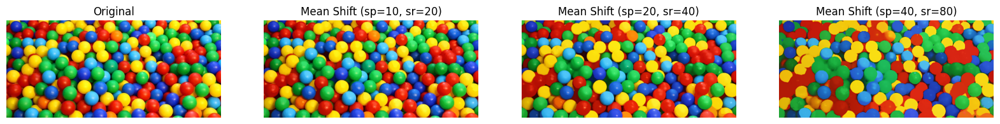

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(image_opencv)
axes[0].set_title("Original")
axes[0].axis("off")

for i, (sp, sr) in enumerate(parameters):
    axes[i + 1].imshow(filtered_images[i])
    axes[i + 1].set_title(f"Mean Shift (sp={sp}, sr={sr})")
    axes[i + 1].axis("off")
plt.show()

Using smaller sp and sr value is able to capture more deatils and textures of the balls. There is some smoothing but the color variations and the edges looks accurate. Using a medium value of sp and sr shows some effects of smoothing. It looks like the colors are starting to merge with one another reducing details. In a high sp and sr value, the smoothing effect is really strong. The colors have merged together at some portions of the images. There is less clear segmentation between individual balls.

Yes, Mean Shift performs better for this image in certain aspects. With a small sp and sr value, it preserves more details while providing some smoothing. Unlike K-Means, it does not require a predefined number of clusters, making it useful when the number of colors is unknown. However, K-Means with a higher K value produces sharper color separation and is computationally faster. Mean Shift is better for preserving edges and gradual color changes, while K-Means excels at precise color segmentation.

## Question 3

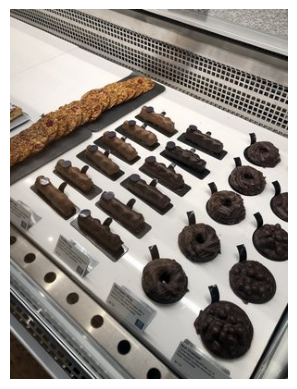

In [8]:
image_opencv2 = cv2.imread('/anvil/projects/tdm/data/yelp/data/photos/lSMrFQi19GpHLI5yuHmnnw.jpg')
image_opencv2 = cv2.cvtColor(image_opencv2, cv2.COLOR_BGR2RGB)
plt.imshow(image_opencv2)
plt.axis('off')
plt.show()

In [9]:
blurred = cv2.GaussianBlur(image_opencv2, (5, 5), 0)
image_gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [10]:
kernel = np.ones((3, 3), np.uint8)
morph_open = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
dilated = cv2.dilate(morph_open, kernel, iterations=3)

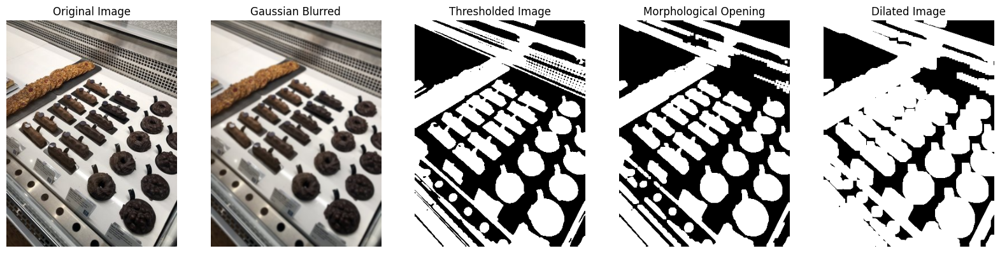

In [11]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

axes[0].imshow(image_opencv2)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(blurred)
axes[1].set_title("Gaussian Blurred")
axes[1].axis("off")

axes[2].imshow(binary, cmap="gray")
axes[2].set_title("Thresholded Image")
axes[2].axis("off")

axes[3].imshow(morph_open, cmap="gray")
axes[3].set_title("Morphological Opening")
axes[3].axis("off")

axes[4].imshow(dilated, cmap="gray")
axes[4].set_title("Dilated Image")
axes[4].axis("off")

plt.show()

The affected parts of the image were the small structures and noise in the background. The black background between the ice creams (i think???) became smaller, allowing the white foreground regions to expand. This effect is especially noticeable in the dilated image, where the background is more clearly defined. The unaffected parts were the larger, connected foreground objects, such as the baked goods themselves. These objects remained mostly intact, as the morphological operations focused on removing noise and filling gaps rather than altering large regions. The background remained relatively unchanged except where small noise was removed.

## Question 4

In [12]:
dist_transform = cv2.distanceTransform(morph_open, cv2.DIST_L2, 5)
dist_transform_uint8 = np.uint8(dist_transform)
_, foreground = cv2.threshold(dist_transform_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
unknown = cv2.subtract(dilated, foreground)

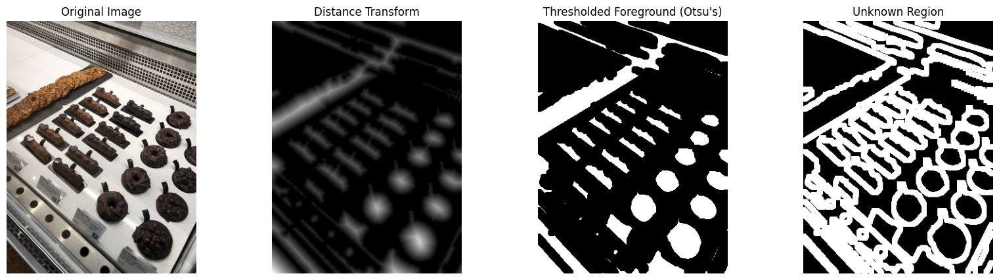

In [13]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(image_opencv2)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(dist_transform, cmap="gray")
axes[1].set_title("Distance Transform")
axes[1].axis("off")

axes[2].imshow(foreground, cmap="gray")
axes[2].set_title("Thresholded Foreground (Otsu's)")
axes[2].axis("off")

axes[3].imshow(unknown, cmap="gray")
axes[3].set_title("Unknown Region")
axes[3].axis("off")
plt.show()

The brightest areas in the image represent pixels that are farther from the nearest background pixels. The center of objects (white regions) appears brighter, while edges and boundaries fade into black. The distance transform works similarly to a topographical map where brighter areas are higher elevations, and darker areas represent lower elevations. Like flooding, the water would rise to fill the background and edges first and then the foreground objects. The water level is seperated by different peaks of the objects.

## Question 5

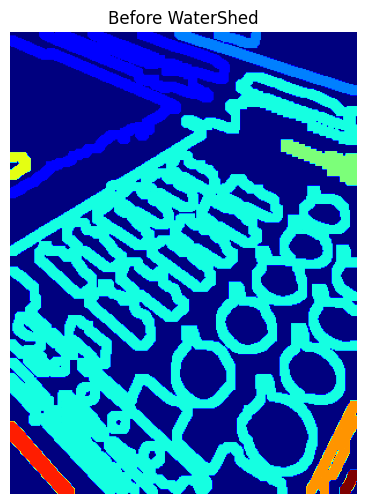

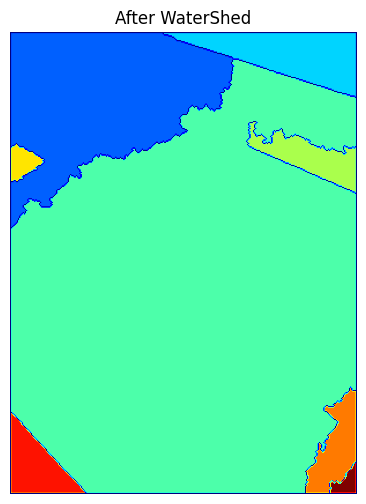

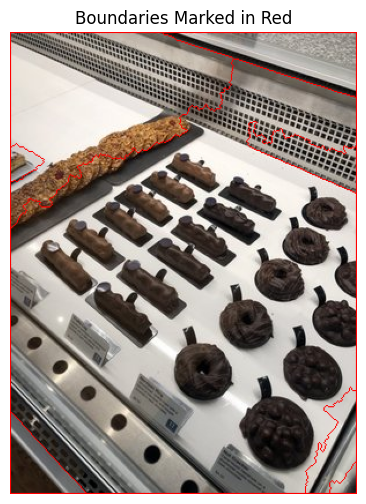

In [14]:
_, markers = cv2.connectedComponents(unknown)
plt.figure(figsize=(6,6))
plt.imshow(markers, cmap='jet') 
plt.title("Before WaterShed")
plt.axis("off")
plt.show()

cv2.watershed(image_opencv2, markers)

plt.figure(figsize=(6,6))
plt.imshow(markers, cmap='jet') 
plt.title("After WaterShed")
plt.axis("off")
plt.show()

image_opencv2[markers == -1] = [255, 0, 0]  

plt.figure(figsize=(6,6))
plt.imshow(image_opencv2) 
plt.title("Boundaries Marked in Red")
plt.axis("off")
plt.show()

I'd say the algorithm clearly defined large background areas, effectively segmenting different regions. Objects that had distinct separation in the input markers were correctly labeled as different segments. The boundaries of major regions are well-defined, showing that the algorithm properly handled the larger, well-separated areas. The foreground objects (such as the pastries or cookies) seem to have merged into a single large segment instead of being individually separated. Fine details and small objects were not well preserved. Some boundaries appear jagged in some areas.

# Project 7

## Question 1

In [1]:
import pandas as pd
Batting = pd.read_csv("/anvil/projects/x-cis220051/data/lahman/data/BattingNEW.csv", names = ["playerID","yearID","stint","teamID","lgID","G","G_batting","AB","R","H","2B","3B","HR","RBI","SB","CS","BB","SO","IBB","HBP","SH","SF","GIDP"])
pd.set_option('display.max_columns', None)
Batting.head()

,playerID,yearID,stint,teamID,lgID,G,G_batting,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
0,aardsda01,2004,1,SFN,NL,11,NaN,0,0,0,0,0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,aardsda01,2006,1,CHN,NL,45,NaN,2,0,0,0,0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0
2,aardsda01,2007,1,CHA,AL,25,NaN,0,0,0,0,0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,aardsda01,2008,1,BOS,AL,47,NaN,1,0,0,0,0,0,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0,0.0
4,aardsda01,2009,1,SEA,AL,73,NaN,0,0,0,0,0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [3]:
df = Batting[['HR', 'RBI']].dropna()
X = df[['HR']]
y = df['RBI']

In [4]:
model = LinearRegression()
model.fit(X, y)

LinearRegression()

In [5]:
coefficients = model.coef_
intercept = model.intercept_
coefficients, intercept

(array([3.41864982]), 6.717360984332222)

In [6]:
poly = PolynomialFeatures(degree = 2, include_bias=True)
X_poly = poly.fit_transform(X)

poly_model = LinearRegression()
poly_model.fit(X_poly, y)

LinearRegression()

In [7]:
poly_coefficients = poly_model.coef_
poly_intercept = poly_model.intercept_
poly_coefficients, poly_intercept

(array([ 0.        ,  5.16043961, -0.06448741]), 4.8849251589399145)

From the output of coeffiencients and intercept we have, RBI = (-0.064)HR^2 + (5.16)HR + 4.885. X^2 is usually added to a linear model, when the model doent fit the data linearly, this could be seen from a scatter plot. If the data seems to have an increasing upward slope (instead of plots scattered around the straight line), then the X^2 is added to increase the accuracy and fitting of the data. Basically, this could capture the non-linearity of the data.

## Question 2

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [9]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

In [10]:
mse_values = {}

for deg in range(1, 6):
    poly = PolynomialFeatures(degree = deg, include_bias = True)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)

    poly_model = LinearRegression()
    poly_model.fit(X_train_poly, y_train)
    y_pred = poly_model.predict(X_test_poly)

    mse = mean_squared_error(y_test, y_pred)
    mse_values[deg] = mse


In [11]:
mse_df = pd.DataFrame(list(mse_values.items()), columns = ['Polynomial Degree', 'MSE'])
mse_df

,Polynomial Degree,MSE
0,1,198.780935
1,2,170.983285
2,3,162.796354
3,4,158.164295
4,5,155.762775


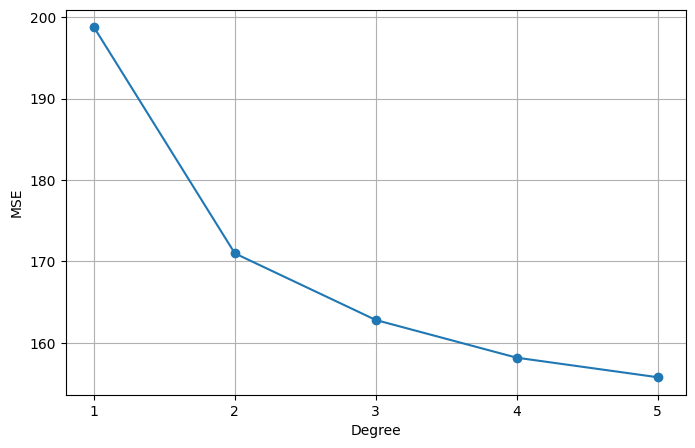

In [12]:
plt.figure(figsize=(8, 5))
plt.plot(list(mse_values.keys()), list(mse_values.values()), marker='o')
plt.xlabel("Degree")
plt.ylabel("MSE")
plt.xticks(range(1, 6))
plt.grid()
plt.show()

It looks like degree 3 might be the best choice. The decrease of MSE from 1-3 is too steep and it slows down after 3. To avoid overfitting, 3 might be the best choice.

## Question 3

In [13]:
from sklearn.model_selection import KFold

repetitions = 100
k_folds = 5

mse_results = {degree: [] for degree in range(1,6)}

for _ in range(repetitions):
    kf = KFold(n_splits = k_folds, shuffle = True, random_state = None)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        for deg in range(1, 6):
            poly = PolynomialFeatures(degree = deg, include_bias = True)
            X_train_poly = poly.fit_transform(X_train)
            X_test_poly = poly.transform(X_test)
        
            poly_model = LinearRegression()
            poly_model.fit(X_train_poly, y_train)
            y_pred = poly_model.predict(X_test_poly)
        
            mse = mean_squared_error(y_test, y_pred)
            mse_results[deg].append(mse)
            
mse_df = pd.DataFrame(mse_results)

In [14]:
random_samples = mse_df.sample(10, random_state=42).reset_index(drop=True)

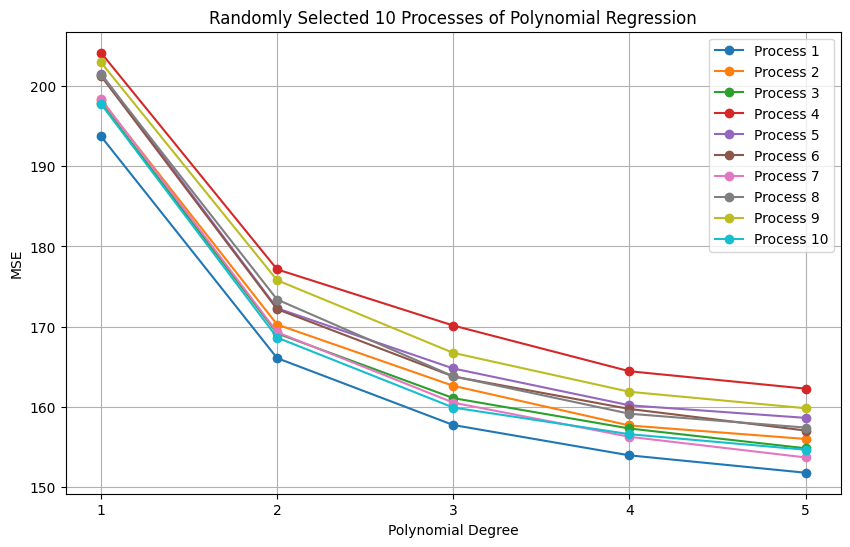

In [15]:
plt.figure(figsize=(10, 6))
for i in range(10):
    plt.plot(range(1, 6), random_samples.iloc[i], marker='o', linestyle='-', label=f"Process {i+1}")

plt.xlabel("Polynomial Degree")
plt.ylabel("MSE")
plt.title("Randomly Selected 10 Processes of Polynomial Regression")
plt.xticks(range(1, 6))
plt.legend()
plt.grid()
plt.show()

In [16]:
avg_mse_df = mse_df.mean().reset_index()
avg_mse_df.columns = ["Degree", "Average MSE"]
avg_mse_df

,Degree,Average MSE
0,1,199.467644
1,2,171.504022
2,3,163.099648
3,4,158.567518
4,5,156.504073


The MSE drops sharply from Degree 1 to 2, then it continues decreasing but at a slower rate from Degree 3 onward. So I think Degree 3 with an average MSE of 163.1 is the best choice. It captures non-linear patterns without excessive complexity. Degree 4 and 5 has marginal improvements but it also increases the risk of overfitting.

## Question 4

In [17]:
from sklearn.utils import resample

bootstrap_samples = 100
bootstrap_mse_results = {degree: [] for degree in range(1, 6)}

In [18]:
for _ in range(bootstrap_samples):
    X_bootstrap, y_bootstrap = resample(X, y, replace=True, random_state=None)
    
    X_train, X_test, y_train, y_test = train_test_split(X_bootstrap, y_bootstrap, test_size=0.2, random_state=42)

    for degree in range(1, 6):
        poly = PolynomialFeatures(degree=degree, include_bias=True)
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        poly_model = LinearRegression()
        poly_model.fit(X_train_poly, y_train)

        y_pred = poly_model.predict(X_test_poly)
        mse = mean_squared_error(y_test, y_pred)

        bootstrap_mse_results[degree].append(mse)

In [19]:
bootstrap_mse_df = pd.DataFrame(bootstrap_mse_results)
mean_mse_bootstrap = bootstrap_mse_df.mean()

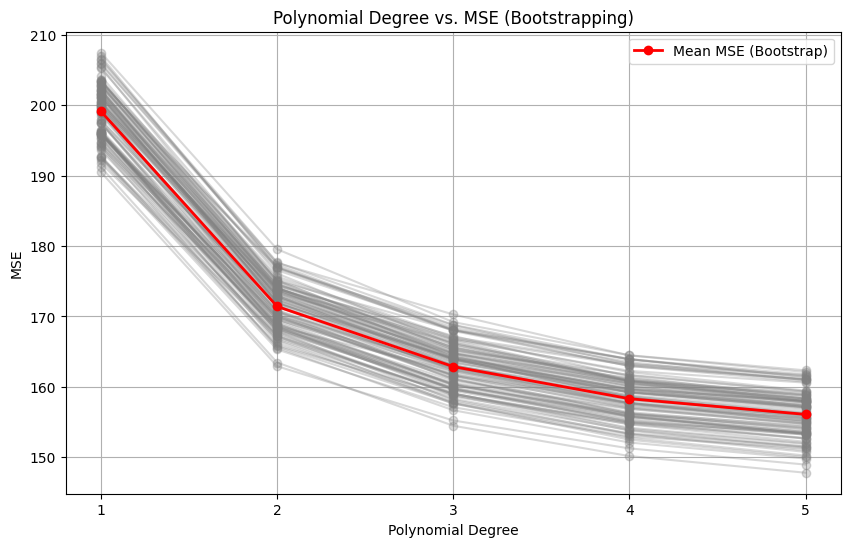

In [20]:
plt.figure(figsize=(10, 6))

for i in range(bootstrap_samples):
    plt.plot(range(1, 6), bootstrap_mse_df.iloc[i], marker='o', linestyle='-', alpha=0.3, color='gray')

plt.plot(range(1, 6), mean_mse_bootstrap, marker='o', linestyle='-', color='red', label="Mean MSE (Bootstrap)", linewidth=2)

plt.xlabel("Polynomial Degree")
plt.ylabel("MSE")
plt.title("Polynomial Degree vs. MSE (Bootstrapping)")
plt.xticks(range(1, 6))
plt.legend()
plt.grid()
plt.show()

In [21]:
mean_mse_df = mean_mse_bootstrap.reset_index()
mean_mse_df.columns = ["Degree", "Mean MSE (Bootstrap)"]
mean_mse_df

,Degree,Mean MSE (Bootstrap)
0,1,199.133400
1,2,171.421376
2,3,162.875141
3,4,158.317196
4,5,156.087339


MSE values are slightly lower with bootstrapping compared to repeated holdout/K-Fold cross-validation. It also looks like the bootstrapping is slightly more stable, especially for higher-degree polynomials. The variance in MSE is reduced because bootstrapping allows the model to learn from overlapping training sets.

## Question 5

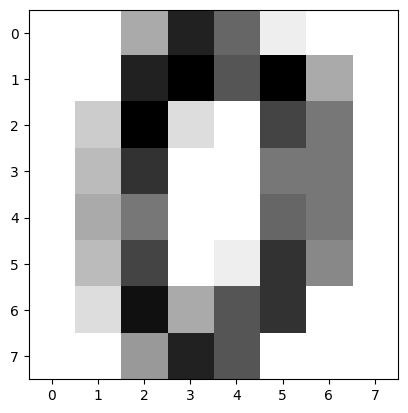

In [22]:
# Libraries
from sklearn.datasets import load_digits
from sklearn.svm import SVC
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Load the Data
numbers = load_digits()
X = numbers.data
y = numbers.target

# Example
fig = plt.figure()
plt.imshow(numbers.images[0], cmap = plt.cm.binary)

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = SVC(C=1, kernel='linear')
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

In [35]:
classification_rep = classification_report(y_test, y_pred, output_dict=True) # predict_test contains the predicted class labels for the test dataset. It is generated by an SVM (or another classifier) using the .predict() function.
classification_df = pd.DataFrame(classification_rep).transpose()
print(classification_df)

              precision    recall  f1-score     support
0              1.000000  1.000000  1.000000   33.000000
1              0.965517  1.000000  0.982456   28.000000
2              1.000000  1.000000  1.000000   33.000000
3              0.969697  0.941176  0.955224   34.000000
4              0.978261  0.978261  0.978261   46.000000
5              0.959184  1.000000  0.979167   47.000000
6              1.000000  1.000000  1.000000   35.000000
7              0.970588  0.970588  0.970588   34.000000
8              1.000000  0.966667  0.983051   30.000000
9              0.948718  0.925000  0.936709   40.000000
accuracy       0.977778  0.977778  0.977778    0.977778
macro avg      0.979196  0.978169  0.978546  360.000000
weighted avg   0.977874  0.977778  0.977686  360.000000


Error matrix:
 [[33  0  0  0  0  0  0  0  0  0]
 [ 0 28  0  0  0  0  0  0  0  0]
 [ 0  0 33  0  0  0  0  0  0  0]
 [ 0  0  0 32  0  1  0  0  0  1]
 [ 0  1  0  0 45  0  0  0  0  0]
 [ 0  0  0  0  0 47  0  0  0  0]
 [ 0  0  0  0  0  0 35  0  0  0]
 [ 0  0  0  0  0  0  0 33  0  1]
 [ 0  0  0  0  0  1  0  0 29  0]
 [ 0  0  0  1  1  0  0  1  0 37]]


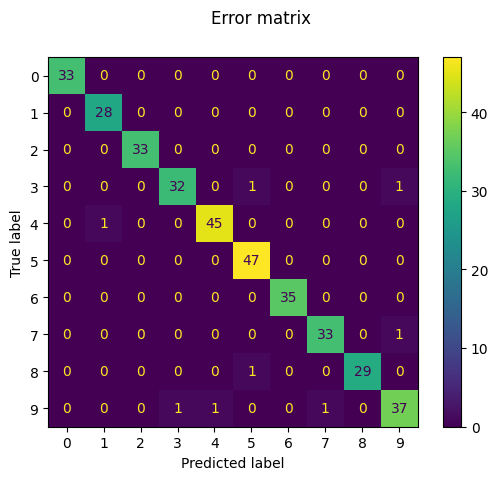

In [36]:
visual = ConfusionMatrixDisplay.from_estimator(svm, X_test, y_test)
visual.figure_.suptitle("Error matrix")
print('Error matrix:\n', visual.confusion_matrix)

The numbers along the diagonal of the confusion matrix shows cases where the model correctly predicted the class. The high values on the diagonal indicate that most predictions are accurate, confirming strong performance. Any non-zero values outside the diagonal shows misclassifications. From this matrix, we can see that the misclassifications are rare and occur at very low frequency (1 meaning it was misclassified once). Overall, the confusion matrix suggests that the model performs consistently well across all digit classes, with very few errors.

# Project 8

## Question 1

In [1]:
library(Lahman)
names(Batting)

[1] "playerID" "yearID"   "stint"    "teamID"   "lgID"     "G"       
 [7] "AB"       "R"        "H"        "X2B"      "X3B"      "HR"      
[13] "RBI"      "SB"       "CS"       "BB"       "SO"       "IBB"     
[19] "HBP"      "SH"       "SF"       "GIDP"

In [2]:
names(People)

[1] "playerID"     "birthYear"    "birthMonth"   "birthDay"     "birthCity"   
 [6] "birthCountry" "birthState"   "deathYear"    "deathMonth"   "deathDay"    
[11] "deathCountry" "deathState"   "deathCity"    "nameFirst"    "nameLast"    
[16] "nameGiven"    "weight"       "height"       "bats"         "throws"      
[21] "debut"        "bbrefID"      "finalGame"    "retroID"      "deathDate"   
[26] "birthDate"

In [3]:
library(dplyr)
library(ggplot2)


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




In [4]:
head(Batting)
head(People)

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,X2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
,<chr>,<int>,<int>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,aardsda01,2004,1,SFN,NL,11,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,aardsda01,2006,1,CHN,NL,45,2,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,aardsda01,2007,1,CHA,AL,25,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,aardsda01,2008,1,BOS,AL,47,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,aardsda01,2009,1,SEA,AL,73,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,aardsda01,2010,1,SEA,AL,53,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,playerID,birthYear,birthMonth,birthDay,birthCity,birthCountry,birthState,deathYear,deathMonth,deathDay,...,weight,height,bats,throws,debut,bbrefID,finalGame,retroID,deathDate,birthDate
,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<int>,...,<int>,<int>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<date>,<date>
1,aardsda01,1981,12,27,Denver,USA,CO,NA,NA,NA,...,215,75,R,R,2004-04-06,aardsda01,2015-08-23,aardd001,NA,1981-12-27
2,aaronha01,1934,2,5,Mobile,USA,AL,2021,1,22,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
3,aaronto01,1939,8,5,Mobile,USA,AL,1984,8,16,...,190,75,R,R,1962-04-10,aaronto01,1971-09-26,aarot101,1984-08-16,1939-08-05
4,aasedo01,1954,9,8,Orange,USA,CA,NA,NA,NA,...,190,75,R,R,1977-07-26,aasedo01,1990-10-03,aased001,NA,1954-09-08
5,abadan01,1972,8,25,Palm Beach,USA,FL,NA,NA,NA,...,184,73,L,L,2001-09-10,abadan01,2006-04-13,abada001,NA,1972-08-25
6,abadfe01,1985,12,17,La Romana,D.R.,La Romana,NA,NA,NA,...,235,74,L,L,2010-07-28,abadfe01,2021-10-01,abadf001,NA,1985-12-17


In [5]:
summary(Batting)
summary(People)

   playerID             yearID         stint           teamID      lgID      
 Length:113799      Min.   :1871   Min.   :1.000   CHN    : 5241   AA: 1893  
 Class :character   1st Qu.:1939   1st Qu.:1.000   PHI    : 5126   AL:52599  
 Mode  :character   Median :1979   Median :1.000   PIT    : 5110   FL:  472  
                    Mean   :1970   Mean   :1.081   SLN    : 5007   NA:  737  
                    3rd Qu.:2004   3rd Qu.:1.000   CIN    : 4917   NL:57615  
                    Max.   :2023   Max.   :5.000   CLE    : 4832   PL:  149  
                                                   (Other):83566   UA:  334  
       G                AB              R                H         
 Min.   :  1.00   Min.   :  0.0   Min.   :  0.00   Min.   :  0.00  
 1st Qu.: 12.00   1st Qu.:  3.0   1st Qu.:  0.00   1st Qu.:  0.00  
 Median : 34.00   Median : 44.0   Median :  4.00   Median :  8.00  
 Mean   : 50.38   Mean   :137.4   Mean   : 18.24   Mean   : 35.84  
 3rd Qu.: 78.00   3rd Qu.:220.0   3r

   playerID           birthYear      birthMonth        birthDay    
 Length:21010       Min.   :1814   Min.   : 1.000   Min.   : 1.00  
 Class :character   1st Qu.:1898   1st Qu.: 4.000   1st Qu.: 8.00  
 Mode  :character   Median :1945   Median : 7.000   Median :16.00  
                    Mean   :1937   Mean   : 6.633   Mean   :15.62  
                    3rd Qu.:1976   3rd Qu.:10.000   3rd Qu.:23.00  
                    Max.   :2003   Max.   :12.000   Max.   :31.00  
                    NA's   :106    NA's   :275      NA's   :417    
  birthCity         birthCountry        birthState          deathYear    
 Length:21010       Length:21010       Length:21010       Min.   :1872   
 Class :character   Class :character   Class :character   1st Qu.:1944   
 Mode  :character   Mode  :character   Mode  :character   Median :1969   
                                                          Mean   :1968   
                                                          3rd Qu.:1996   
            

In [6]:
# Merge two datasets
full_data <- Batting %>%
  left_join(People, by = "playerID") %>%
  na.omit()

In [7]:
head(full_data)

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,X2B,...,weight,height,bats,throws,debut,bbrefID,finalGame,retroID,deathDate,birthDate
,<chr>,<int>,<int>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<date>,<date>
11,aaronha01,1955,1,ML1,NL,153,602,105,189,37,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
12,aaronha01,1956,1,ML1,NL,153,609,106,200,34,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
13,aaronha01,1957,1,ML1,NL,151,615,118,198,27,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
14,aaronha01,1958,1,ML1,NL,153,601,109,196,34,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
15,aaronha01,1959,1,ML1,NL,154,629,116,223,46,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05
16,aaronha01,1960,1,ML1,NL,153,590,102,172,20,...,180,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05


In [8]:
full_data <- full_data %>%
    mutate(age = yearID - birthYear)

In [9]:
head(full_data)

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,X2B,...,height,bats,throws,debut,bbrefID,finalGame,retroID,deathDate,birthDate,age
,<chr>,<int>,<int>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,...,<int>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<date>,<date>,<int>
11,aaronha01,1955,1,ML1,NL,153,602,105,189,37,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,21
12,aaronha01,1956,1,ML1,NL,153,609,106,200,34,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,22
13,aaronha01,1957,1,ML1,NL,151,615,118,198,27,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,23
14,aaronha01,1958,1,ML1,NL,153,601,109,196,34,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,24
15,aaronha01,1959,1,ML1,NL,154,629,116,223,46,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,25
16,aaronha01,1960,1,ML1,NL,153,590,102,172,20,...,72,R,R,1954-04-13,aaronha01,1976-10-03,aaroh101,2021-01-22,1934-02-05,26


## Question 2

In [10]:
# Fit a linear model
lm_model <- lm(RBI ~ yearID + lgID + H + X3B + HR + SB + CS + BB + SO + age + height + weight + bats, data = full_data)

# Display model summary
summary(lm_model)


Call:
lm(formula = RBI ~ yearID + lgID + H + X3B + HR + SB + CS + BB + 
    SO + age + height + weight + bats, data = full_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.478  -1.072  -0.157   0.907  43.516 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.356e+01  6.237e+00  -3.778 0.000159 ***
yearID       9.526e-03  3.170e-03   3.005 0.002657 ** 
lgIDNL      -8.383e-02  8.601e-02  -0.975 0.329760    
H            3.027e-01  2.515e-03 120.344  < 2e-16 ***
X3B         -4.284e-04  3.745e-02  -0.011 0.990873    
HR           1.618e+00  1.242e-02 130.268  < 2e-16 ***
SB          -1.600e-01  1.330e-02 -12.026  < 2e-16 ***
CS          -2.942e-01  3.554e-02  -8.280  < 2e-16 ***
BB           3.908e-02  4.696e-03   8.321  < 2e-16 ***
SO          -4.960e-03  3.381e-03  -1.467 0.142398    
age          6.112e-02  9.381e-03   6.516 7.51e-11 ***
height      -1.503e-02  2.712e-02  -0.554 0.579388    
weight       2.016e-02  3.712e-03   5.431 5.71

The model shows that lgIDNL, X3B, SO, and height are statistically insignificant, as their p-values are greater than 0.05. The Multiple R-squared value of 0.964 indicates a strong fit, meaning the model explains approximately 96.4% of the variance in RBI. The F-statistic with a p-value less than 0.05 suggests that the overall model is statistically significant.

In [11]:
lmmodel <- lm(RBI ~ HR + age, data = full_data)
coef <-coef(lmmodel)
coef

(Intercept)          HR         age 
 1.45063041  3.33944606  0.09302909

In [12]:
beta0 <- coef[1] 
beta1 <- coef[2]  
beta2 <- coef[3]  

predict <- beta0 + beta1 * full_data$HR + beta2 * full_data$age

residuals <- full_data$RBI - predict

RSS <- sum(residuals^2)
RSS

[1] 1208575

## Question 3

The lambda is the tuning parameter that allows the Ridge regression to apply the penalty in order to reduce overfitting. As the graph shows as the lambda increases, ridge regression coefficients goes towards zero. The higher it is, the more it shrinks the model to avoid overfitting and improve generalization. 

In [13]:
# Load necessary library
library(glmnet)

# Prepare the matrix of predictors (excluding the response variable)
X <- model.matrix(RBI ~ yearID + lgID + H + X3B + HR + SB + CS + BB + SO + age + height + weight + bats, data = full_data)[, -1]
y <- full_data$RBI

# Standardize predictors
X_scaled <- scale(X)

# Replace NaNs (from zero variance) with 0
X_scaled[is.na(X_scaled)] <- 0  # lgID variable has some non-observed values in the data

# Fit ridge regression model (alpha = 0 for ridge)
ridge_model <- glmnet(X_scaled, y, alpha = 0)
coef(ridge_model)
ridge_model$lambda

Loading required package: Matrix

Loaded glmnet 4.1-8

  [[ suppressing 100 column names 's0', 's1', 's2' ... ]]



20 x 100 sparse Matrix of class "dgCMatrix"
                                                                   
(Intercept)  1.510367e+01 15.1036699487 15.1036699487 15.1036699487
yearID       1.078023e-36  0.0012420552  0.0013620358  0.0014934895
lgIDAL       2.129895e-37  0.0002468284  0.0002708252  0.0002971475
lgIDFL       .             .             .             .           
lgIDNA       .             .             .             .           
lgIDNL      -2.129895e-37 -0.0002468284 -0.0002708252 -0.0002971475
lgIDPL       .             .             .             .           
lgIDUA       .             .             .             .           
H            2.365336e-35  0.0273341704  0.0299833854  0.0328877044
X3B          1.747630e-35  0.0201805862  0.0221348523  0.0242769661
HR           2.322190e-35  0.0268516511  0.0294558341  0.0323111211
SB           1.116057e-35  0.0128657770  0.0141093604  0.0154720023
CS           1.389789e-35  0.0160317715  0.0175824980  0.0192819130
BB  

[1] 23415.873768 21335.672080 19440.269776 17713.249788 16139.653497
  [6] 14705.851163 13399.423877 12209.055990 11124.437105 10136.172773
 [11]  9235.703120  8415.228710  7667.642985  6986.470715  6365.811912
 [16]  5800.290727  5285.008885  4815.503262  4387.707224  3997.915407
 [21]  3642.751621  3319.139607  3024.276392  2755.608013  2510.807392
 [26]  2287.754183  2084.516407  1899.333714  1730.602142  1576.860217
 [31]  1436.776302  1309.137055  1192.836927  1086.868582   990.314173
 [36]   902.337391   822.176224   749.136354   682.585145   621.946162
 [41]   566.694180   516.350630   470.479464   428.683365   390.600316
 [46]   355.900461   324.283245   295.474815   269.225647   245.308382
 [51]   223.515862   203.659329   185.566795   169.081552   154.060813
 [56]   140.374475   127.903994   116.541356   106.188143    96.754681
 [61]    88.159262    80.327436    73.191368    66.689248    60.764759
 [66]    55.366586    50.447971    45.966312    41.882792    38.162040
 [71]    34.771829    31.682796    28.868184    26.303614    23.966873
 [76]    21.837722    19.897719    18.130061    16.519436    15.051895
 [81]    13.714726    12.496348    11.386206    10.374687     9.453029
 [86]     8.613248     7.848070     7.150870     6.515606     5.936777
 [91]     5.409371     4.928817     4.490954     4.091990     3.728469
 [96]     3.397242     3.095441     2.820450     2.569889     2.341587

In [14]:
length(ridge_model$lambda)

[1] 100

## Question 4

In [15]:
X <- model.matrix(RBI ~ yearID + lgID + H + X3B + HR + SB + CS + BB + SO + age + height + weight + bats, data = full_data)[, -1]
y <- full_data$RBI

X_scaled <- scale(X)

X_scaled[is.na(X_scaled)] <- 0  

lasso_model <- glmnet(X_scaled, y, alpha = 1)
coef(lasso_model)
lasso_model$lambda

  [[ suppressing 67 column names 's0', 's1', 's2' ... ]]



20 x 67 sparse Matrix of class "dgCMatrix"
                                                                        
(Intercept) 15.10367 15.10366995 15.103670 15.103670 15.103670 15.103670
yearID       .        .           .         .         .         .       
lgIDAL       .        .           .         .         .         .       
lgIDFL       .        .           .         .         .         .       
lgIDNA       .        .           .         .         .         .       
lgIDNL       .        .           .         .         .         .       
lgIDPL       .        .           .         .         .         .       
lgIDUA       .        .           .         .         .         .       
H            .        2.05618612  3.116195  4.081868  4.961752  5.763470
X3B          .        .           .         .         .         .       
HR           .        0.03424818  1.095153  2.061941  2.942843  3.745488
SB           .        .           .         .         .         .       
CS      

[1] 23.41587377 21.33567208 19.44026978 17.71324979 16.13965350 14.70585116
 [7] 13.39942388 12.20905599 11.12443711 10.13617277  9.23570312  8.41522871
[13]  7.66764298  6.98647071  6.36581191  5.80029073  5.28500888  4.81550326
[19]  4.38770722  3.99791541  3.64275162  3.31913961  3.02427639  2.75560801
[25]  2.51080739  2.28775418  2.08451641  1.89933371  1.73060214  1.57686022
[31]  1.43677630  1.30913705  1.19283693  1.08686858  0.99031417  0.90233739
[37]  0.82217622  0.74913635  0.68258515  0.62194616  0.56669418  0.51635063
[43]  0.47047946  0.42868336  0.39060032  0.35590046  0.32428324  0.29547481
[49]  0.26922565  0.24530838  0.22351586  0.20365933  0.18556680  0.16908155
[55]  0.15406081  0.14037448  0.12790399  0.11654136  0.10618814  0.09675468
[61]  0.08815926  0.08032744  0.07319137  0.06668925  0.06076476  0.05536659
[67]  0.05044797

In [16]:
length(lasso_model$lambda)

[1] 67

## Question 5

In [17]:
# Perform LASSO regression using cross-validation
set.seed(42) # optional, just for reproducibility
lasso_cv <- cv.glmnet(X_scaled, y, alpha = 1)  # alpha = 1 for LASSO

# Extract the best lambda value
best_lambda <- lasso_cv$lambda.min
print(paste("Best Lambda:", best_lambda))

[1] "Best Lambda: 0.0504479707436651"


In [18]:
lasso_final <- glmnet(X_scaled, y, alpha = 1, lambda = best_lambda)
lasso_coefs <- coef(lasso_final)
lasso_coefs

20 x 1 sparse Matrix of class "dgCMatrix"
                     s0
(Intercept) 15.10366995
yearID       0.07294574
lgIDAL       .         
lgIDFL       .         
lgIDNA       .         
lgIDNL       .         
lgIDPL       .         
lgIDUA       .         
H           14.83891598
X3B          .         
HR          11.14258468
SB          -0.87698488
CS          -0.57898343
BB           0.75770167
SO           .         
age          0.25889217
height       .         
weight       0.26425370
batsL        0.02359554
batsR        .         

In [19]:
# Ridge
set.seed(42)
ridge_cv <- cv.glmnet(X_scaled, y, alpha = 0)
best_lambda_ridge <- ridge_cv$lambda.min
best_lambda_ridge

[1] 2.341587

In [20]:
ridge_final <- glmnet(X_scaled, y, alpha = 0, lambda = best_lambda_ridge)
ridge_coefs <- coef(ridge_final)
ridge_coefs

20 x 1 sparse Matrix of class "dgCMatrix"
                     s0
(Intercept) 15.10366995
yearID       0.06801738
lgIDAL       0.03106429
lgIDFL       .         
lgIDNA       .         
lgIDNL      -0.03005054
lgIDPL       .         
lgIDUA       .         
H            9.99338733
X3B          1.31612848
HR           9.72564068
SB          -0.78952305
CS          -0.07196828
BB           3.04906792
SO           1.97126745
age          0.40241795
height      -0.12228594
weight       0.39244222
batsL        0.38494571
batsR        0.32351299

# Project 10

## Question 1

In [1]:
def read_lines(file_path, n, start=0):
    lines = []
    with open(file_path, 'r') as f:
        for i, line in enumerate(f):
            if i < start:
                continue
            elif i >= start + n:
                break
            lines.append(line)
    return lines

In [2]:
import codecs
import math
def clean_text(text):

    text = codecs.decode(text, 'unicode_escape')
    text = text.replace('\n', ' ')
    if text.startswith('"') and text.endswith('"'):
        text = text[1:-1]
    text = text.lower()
    text = ''.join(c for c in text if c.isalpha() or c.isspace())
    text = ' '.join(text.split())
    return text

In [3]:
class NGram:
    def __init__(self, n, is_character_based=False):
        self.n = n
        self.data = None
        self.is_character_based = is_character_based
        self.ngrams = set()
        self.ngram_frequencies = {}
        self.ngram_probabilities = {}

    def set_data(self, data):
        cleaned_data = []
        for element in data:
            cleaned_line = clean_text(element)
            if self.is_character_based:
                cleaned_data.append(cleaned_line)
            else:
                word_tuple = tuple(cleaned_line.split())
                cleaned_data.append(word_tuple)
        self.data = cleaned_data

    def generate_ngrams(self):
        if not isinstance(self.data, list) or not self.data:
            self.ngram_frequencies = {}
            return self.ngram_frequencies

        frequency = {}  
        
        # Char
        if self.is_character_based:
            for text in self.data:
                for i in range(len(text) - self.n + 1):
                    gram = text[i:i+self.n]
                    frequency[gram] = frequency.get(gram, 0) + 1
        # Word
        else:
            for words in self.data:
                for i in range(len(words) - self.n + 1):
                    gram = words[i:i+self.n] 
                    frequency[gram] = frequency.get(gram, 0) + 1

        self.ngram_frequencies = frequency
        return frequency

    def generate_ngram_probabilities(self):
        frequency = self.generate_ngrams()
        if not isinstance(frequency, dict) or not frequency:
            self.ngram_probabilities = {}
            return self.ngram_probabilities
    
        prefix_counts = {}
        probabilities = {}
    
        for gram, count in frequency.items():
            if self.is_character_based:
                prefix = gram[:-1]  
                last = gram[-1]   
            else:
                prefix = gram[:-1]  
                last = gram[-1]   
            
            prefix_counts[prefix] = prefix_counts.get(prefix, 0) + count
            
            if prefix not in probabilities:
                probabilities[prefix] = {}
            probabilities[prefix][last] = probabilities[prefix].get(last, 0) + count
    
        for prefix, last_counts in probabilities.items():
            total = prefix_counts[prefix]
            for last, count in last_counts.items():
                last_counts[last] = count / total

        self.ngram_probabilities = probabilities
        return probabilities
        

    def get_next_word(self, previous_words, method='random'):
        if not self.ngram_probabilities or not isinstance(self.ngram_probabilities, dict):
            return ""
        
        if self.is_character_based:
            if len(previous_words) != self.n - 1:
                return ""
            prefix = previous_words
        else:
            last = previous_words.split()
            if len(last) != self.n - 1:
                return ""
            prefix = tuple(last)

        if prefix not in self.ngram_probabilities:
            return ""
            
        last_probs = self.ngram_probabilities[prefix]

        if method == 'random':
            last_list = list(last_probs.keys())
            probabilities = list(last_probs.values())
            choice = np.random.choice(last_list, p=probabilities)
            return str(choice)
        elif method == 'common':
            common_last = max(last_probs, key=lambda k: last_probs[k])
            return str(common_last)
        elif method == 'uncommon':
            uncommon_last = min(last_probs, key=lambda k: last_probs[k])
            return str(uncommon_last)
        else:
            last_list = list(last_probs.keys())
            probabilities = list(last_probs.values())
            choice = np.random.choice(last_list, p=probabilities)
            return str(choice)

    def get_perplexity(self, text):
        H = 2  
        if self.is_character_based:
            last = list(text) 
        else:
            last = text.split()  
        
        N = len(last)
        if N < self.n:
            return float('inf')
        
        log_prob_sum = 0.0
        for i in range(N - (self.n - 1)):
            if self.is_character_based:
                prefix = ''.join(last[i:i+self.n-1])
                token = last[i+self.n-1]
            else:
                prefix = tuple(last[i:i+self.n-1])
                token = last[i+self.n-1]
            
            if prefix in self.ngram_probabilities:
                prob = self.ngram_probabilities[prefix].get(token, 0.00001)
            else:
                prob = 0.00001

            log_prob = math.log(prob) / math.log(H)
            log_prob_sum += log_prob
        
        avg_neg_log_prob = - (log_prob_sum / N)
        perplexity = H ** avg_neg_log_prob
        return perplexity

In [4]:
my_ngram = NGram(2, is_character_based=True)
my_ngram.set_data(["\"hello!\""])
print(my_ngram.data) # should return ['hello']

my_ngram = NGram(2, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 2))
print(my_ngram.data) # should return a list of lists of strings like below:

['hello']
[('i', 'love', 'this', 'cd', 'so', 'inspiring'), ('love', 'it', 'great', 'seller')]


['hello']
[('i', 'love', 'this', 'cd', 'so', 'inspiring'), ('love', 'it', 'great', 'seller')]

## Question 2

In [5]:
my_ngram = NGram(2, is_character_based=True)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 1, 14))
print(my_ngram.generate_ngrams())

# Should return the following dictionary:
'''
{'ha': 3, 'ad': 1, 'd ': 3, ' t': 3, 'th': 4, 'hi': 2, 'is': 2, 's ': 5, ' a': 4, 'as': 1, 'an': 1, 'n ': 2, 'al': 2, 'lb': 1, 'bu': 1, 'um': 1, 'm ': 1, ' b': 1, 'ba': 1, 'ac': 1, 'ck': 1, 'k ': 1, ' i': 1, 'in': 1, 'he': 1, 'e ': 4, ' d': 1, 'da': 1, 'ay': 2, 'y ': 2, '  ': 1, ' h': 2, 'av': 2, 've': 3, 'lw': 1, 'wa': 1, 'ys': 1, ' e': 2, 'en': 2, 'nj': 1, 'jo': 1, 'oy': 1, 'ye': 1, 'ed': 1, ' k': 1, 'ki': 1, 'ie': 1, 'et': 1, 'h ': 1, ' g': 1, 'gr': 1, 're': 1, 'ee': 1, 'ns': 1, ' m': 1, 'mu': 1, 'us': 1, 'si': 1, 'ic': 1, 'c ': 1, 'ev': 1, 'er': 1, 'ry': 1, ' o': 1, 'on': 1, 'ne': 1, ' s': 1, 'sh': 1, 'ho': 1, 'ou': 1, 'ul': 1, 'ld': 1, ' c': 1, 'cd': 1}
'''

my_ngram = NGram(2, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 1, 14))
print(my_ngram.generate_ngrams())

{'ha': 3, 'ad': 1, 'd ': 3, ' t': 3, 'th': 4, 'hi': 2, 'is': 2, 's ': 5, ' a': 4, 'as': 1, 'an': 1, 'n ': 2, 'al': 2, 'lb': 1, 'bu': 1, 'um': 1, 'm ': 1, ' b': 1, 'ba': 1, 'ac': 1, 'ck': 1, 'k ': 1, ' i': 1, 'in': 1, 'he': 1, 'e ': 4, ' d': 1, 'da': 1, 'ay': 2, 'y ': 2, ' h': 2, 'av': 2, 've': 3, 'lw': 1, 'wa': 1, 'ys': 1, ' e': 2, 'en': 2, 'nj': 1, 'jo': 1, 'oy': 1, 'ye': 1, 'ed': 1, ' k': 1, 'ki': 1, 'ie': 1, 'et': 1, 'h ': 1, ' g': 1, 'gr': 1, 're': 1, 'ee': 1, 'ns': 1, ' m': 1, 'mu': 1, 'us': 1, 'si': 1, 'ic': 1, 'c ': 1, 'ev': 1, 'er': 1, 'ry': 1, ' o': 1, 'on': 1, 'ne': 1, ' s': 1, 'sh': 1, 'ho': 1, 'ou': 1, 'ul': 1, 'ld': 1, ' c': 1, 'cd': 1}
{('had', 'this'): 1, ('this', 'as'): 1, ('as', 'an'): 1, ('an', 'album'): 1, ('album', 'back'): 1, ('back', 'in'): 1, ('in', 'the'): 1, ('the', 'day'): 1, ('day', 'have'): 1, ('have', 'always'): 1, ('always', 'enjoyed'): 1, ('enjoyed', 'kieth'): 1, ('kieth', 'greens'): 1, ('greens', 'music'): 1, ('music', 'every'): 1, ('every', 'one'): 1, (

{'ha': 3, 'ad': 1, 'd ': 3, ' t': 3, 'th': 4, 'hi': 2, 'is': 2, 's ': 5, ' a': 4, 'as': 1, 'an': 1, 'n ': 2, 'al': 2, 'lb': 1, 'bu': 1, 'um': 1, 'm ': 1, ' b': 1, 'ba': 1, 'ac': 1, 'ck': 1, 'k ': 1, ' i': 1, 'in': 1, 'he': 1, 'e ': 4, ' d': 1, 'da': 1, 'ay': 2, 'y ': 2, ' h': 2, 'av': 2, 've': 3, 'lw': 1, 'wa': 1, 'ys': 1, ' e': 2, 'en': 2, 'nj': 1, 'jo': 1, 'oy': 1, 'ye': 1, 'ed': 1, ' k': 1, 'ki': 1, 'ie': 1, 'et': 1, 'h ': 1, ' g': 1, 'gr': 1, 're': 1, 'ee': 1, 'ns': 1, ' m': 1, 'mu': 1, 'us': 1, 'si': 1, 'ic': 1, 'c ': 1, 'ev': 1, 'er': 1, 'ry': 1, ' o': 1, 'on': 1, 'ne': 1, ' s': 1, 'sh': 1, 'ho': 1, 'ou': 1, 'ul': 1, 'ld': 1, ' c': 1, 'cd': 1}
{('had', 'this'): 1, ('this', 'as'): 1, ('as', 'an'): 1, ('an', 'album'): 1, ('album', 'back'): 1, ('back', 'in'): 1, ('in', 'the'): 1, ('the', 'day'): 1, ('day', 'have'): 1, ('have', 'always'): 1, ('always', 'enjoyed'): 1, ('enjoyed', 'kieth'): 1, ('kieth', 'greens'): 1, ('greens', 'music'): 1, ('music', 'every'): 1, ('every', 'one'): 1, ('one', 'should'): 1, ('should', 'have'): 1, ('have', 'this'): 1, ('this', 'cd'): 1}

## Question 3

In [6]:
my_ngram = NGram(3, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 5, 3))
my_ngram.generate_ngram_probabilities()
print(my_ngram.ngram_probabilities)

# Your output should be decently long. You should be able to find near the center the following:
# ('one', 'good'): {'album': 1.0}, ('good', 'album'): {'and': 0.5, 'because': 0.5}, ('album', 'and'): {'all': 1.0}

{('as', 'good'): {'as': 1.0}, ('good', 'as'): {'i': 1.0}, ('as', 'i'): {'remember': 1.0}, ('i', 'remember'): {'back': 1.0}, ('remember', 'back'): {'when': 1.0}, ('back', 'when'): {'i': 1.0}, ('when', 'i'): {'bought': 1.0}, ('i', 'bought'): {'the': 1.0}, ('bought', 'the'): {'one': 1.0}, ('the', 'one'): {'in': 1.0}, ('one', 'in'): {'the': 1.0}, ('in', 'the'): {'s': 1.0}, ('one', 'of'): {'my': 1.0}, ('of', 'my'): {'very': 1.0}, ('my', 'very'): {'favourite': 1.0}, ('very', 'favourite'): {'albums': 0.5, 'singers': 0.5}, ('favourite', 'albums'): {'from': 1.0}, ('albums', 'from'): {'one': 1.0}, ('from', 'one'): {'of': 1.0}, ('favourite', 'singers'): {'i': 1.0}, ('singers', 'i'): {'was': 1.0}, ('i', 'was'): {'happy': 1.0}, ('was', 'happy'): {'to': 1.0}, ('happy', 'to'): {'see': 1.0}, ('to', 'see'): {'i': 1.0}, ('see', 'i'): {'could': 1.0}, ('i', 'could'): {'replace': 1.0}, ('could', 'replace'): {'the': 1.0}, ('replace', 'the'): {'old': 1.0}, ('the', 'old'): {'worn': 1.0}, ('old', 'worn'): {'ca

{('as', 'good'): {'as': 1.0}, ('good', 'as'): {'i': 1.0}, ('as', 'i'): {'remember': 1.0}, ('i', 'remember'): {'back': 1.0}, ('remember', 'back'): {'when': 1.0}, ('back', 'when'): {'i': 1.0}, ('when', 'i'): {'bought': 1.0}, ('i', 'bought'): {'the': 1.0}, ('bought', 'the'): {'one': 1.0}, ('the', 'one'): {'in': 1.0}, ('one', 'in'): {'the': 1.0}, ('in', 'the'): {'s': 1.0}, ('one', 'of'): {'my': 1.0}, ('of', 'my'): {'very': 1.0}, ('my', 'very'): {'favourite': 1.0}, ('very', 'favourite'): {'albums': 0.5, 'singers': 0.5}, ('favourite', 'albums'): {'from': 1.0}, ('albums', 'from'): {'one': 1.0}, ('from', 'one'): {'of': 1.0}, ('favourite', 'singers'): {'i': 1.0}, ('singers', 'i'): {'was': 1.0}, ('i', 'was'): {'happy': 1.0}, ('was', 'happy'): {'to': 1.0}, ('happy', 'to'): {'see': 1.0}, ('to', 'see'): {'i': 1.0}, ('see', 'i'): {'could': 1.0}, ('i', 'could'): {'replace': 1.0}, ('could', 'replace'): {'the': 1.0}, ('replace', 'the'): {'old': 1.0}, ('the', 'old'): {'worn': 1.0}, ('old', 'worn'): {'cassettes': 1.0}, ('worn', 'cassettes'): {'from': 1.0}, ('cassettes', 'from'): {'years': 1.0}, ('from', 'years'): {'ago': 1.0}, ('thank', 'you'): {'jesus': 1.0}, ('you', 'jesus'): {'lord': 1.0}, ('jesus', 'lord'): {'god': 1.0}, ('lord', 'god'): {'that': 1.0}, ('god', 'that'): {'brother': 1.0}, ('that', 'brother'): {'greens': 1.0}, ('brother', 'greens'): {'music': 1.0}, ('greens', 'music'): {'is': 0.5, 'are': 0.5}, ('music', 'is'): {'still': 1.0}, ('is', 'still'): {'sounding': 1.0}, ('still', 'sounding'): {'though': 1.0}, ('sounding', 'though'): {'he': 1.0}, ('though', 'he'): {'is': 1.0}, ('he', 'is'): {'home': 1.0}, ('is', 'home'): {'with': 1.0}, ('home', 'with'): {'you': 1.0}, ('with', 'you'): {'now': 1.0}, ('i', 'recall'): {'loving': 1.0}, ('recall', 'loving'): {'his': 1.0}, ('loving', 'his'): {'other': 1.0}, ('his', 'other'): {'albums': 1.0}, ('other', 'albums'): {'and': 1.0}, ('albums', 'and'): {'maybe': 1.0}, ('and', 'maybe'): {'this': 1.0}, ('maybe', 'this'): {'one': 1.0}, ('this', 'one'): {'too': 1.0}, ('one', 'too'): {'forgot': 1.0}, ('too', 'forgot'): {'but': 1.0}, ('forgot', 'but'): {'i': 1.0}, ('but', 'i'): {'figured': 1.0}, ('i', 'figured'): {'on': 1.0}, ('figured', 'on'): {'some': 1.0}, ('on', 'some'): {'of': 1.0}, ('some', 'of'): {'these': 1.0}, ('of', 'these'): {'artists': 1.0}, ('these', 'artists'): {'seems': 1.0}, ('artists', 'seems'): {'like': 1.0}, ('seems', 'like'): {'one': 1.0}, ('like', 'one'): {'good': 1.0}, ('one', 'good'): {'album': 1.0}, ('good', 'album'): {'and': 0.5, 'because': 0.5}, ('album', 'and'): {'all': 1.0}, ('and', 'all'): {'good': 1.0}, ('all', 'good'): {'albumsespecially': 1.0}, ('good', 'albumsespecially'): {'in': 1.0}, ('albumsespecially', 'in'): {'christian': 1.0}, ('in', 'christian'): {'musicseemed': 1.0}, ('christian', 'musicseemed'): {'when': 1.0}, ('musicseemed', 'when'): {'they': 1.0}, ('when', 'they'): {'got': 1.0}, ('they', 'got'): {'into': 1.0}, ('got', 'into'): {'it': 1.0}, ('into', 'it'): {'they': 0.5, 'and': 0.5}, ('it', 'they'): {'stayed': 1.0}, ('they', 'stayed'): {'into': 1.0}, ('stayed', 'into'): {'it': 1.0}, ('it', 'and'): {'so': 1.0}, ('and', 'so'): {'good': 1.0}, ('so', 'good'): {'to': 1.0}, ('good', 'to'): {'double': 1.0}, ('to', 'double'): {'check': 1.0}, ('double', 'check'): {'though': 1.0}, ('check', 'though'): {'if': 1.0}, ('though', 'if'): {'want': 1.0}, ('if', 'want'): {'too': 1.0}, ('want', 'too'): {'but': 1.0}, ('too', 'but'): {'it': 1.0}, ('but', 'it'): {'is': 1.0}, ('it', 'is'): {'a': 1.0}, ('is', 'a'): {'possible': 1.0}, ('a', 'possible'): {'very': 1.0}, ('possible', 'very'): {'good': 1.0}, ('very', 'good'): {'album': 1.0}, ('album', 'because'): {'i': 1.0}, ('because', 'i'): {'usually': 1.0}, ('i', 'usually'): {'recall': 1.0}, ('usually', 'recall'): {'if': 1.0}, ('recall', 'if'): {'too': 1.0}, ('if', 'too'): {'bad': 1.0}, ('too', 'bad'): {'of': 1.0}, ('bad', 'of'): {'one': 1.0}, ('of', 'one'): {'and': 1.0}, ('one', 'and'): {'i': 1.0}, ('and', 'i'): {'dont': 1.0}, ('i', 'dont'): {'on': 1.0}, ('dont', 'on'): {'this': 1.0}, ('on', 'this'): {'one': 1.0}, ('keith', 'greens'): {'music': 1.0}, ('music', 'are'): {'a': 1.0}, ('are', 'a'): {'great': 1.0}, ('a', 'great'): {'encouragement': 1.0}, ('great', 'encouragement'): {'and': 1.0}, ('encouragement', 'and'): {'unique': 1.0}, ('and', 'unique'): {'in': 1.0}, ('unique', 'in'): {'style': 1.0}, ('in', 'style'): {'i': 1.0}, ('style', 'i'): {'plan': 1.0}, ('i', 'plan'): {'to': 1.0}, ('plan', 'to'): {'purchase': 1.0}, ('to', 'purchase'): {'the': 1.0}, ('purchase', 'the'): {'other': 1.0}, ('the', 'other'): {'albums': 1.0}}


## Question 4

In [7]:
import numpy as np
my_ngram = NGram(3, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 300, 50))
my_ngram.generate_ngram_probabilities()
np.random.seed(18)
print(my_ngram.get_next_word('is a', method='random')) # random word from the n-gram probabilities: truly
print(my_ngram.get_next_word('is a', method='random')) # random word from the n-gram probabilities: very
print(my_ngram.get_next_word('is a', method='random')) # random word from the n-gram probabilities: show

print(my_ngram.get_next_word('is a', method='common')) # most common word from the n-gram probabilities: great
print(my_ngram.get_next_word('is a', method='uncommon')) # least common word from the n-gram probabilities: masterpiece

truly
very
show
great
masterpiece


truly
very
show
great
masterpiece

## Question 5

In [8]:
my_ngram = NGram(3, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 50000))
my_ngram.generate_ngram_probabilities()
print(my_ngram.get_perplexity('is a great cd')) # 3.513998171326
print(my_ngram.get_perplexity('is a good cd')) # 5.461575334059693
print(my_ngram.get_perplexity('is a bad cd')) # 11.67642266413374

print(my_ngram.get_perplexity('this music is a wonderful experience and i love it')) # 27.903381350329948

3.513998171326
5.461575334059693
11.67642266413374
27.90338135032993


3.513998171326
5.461575334059693
11.67642266413374
27.90338135032993

# Project 11

## Question 1

In [1]:
def read_lines(file_path, n, start=0):
    lines = []
    with open(file_path, 'r') as f:
        for i, line in enumerate(f):
            if i < start:
                continue
            elif i >= start + n:
                break
            lines.append(line)
    return lines

In [2]:
import codecs
import math
import numpy as np
def clean_text(text):

    text = codecs.decode(text, 'unicode_escape')
    text = text.replace('\n', ' ')
    if text.startswith('"') and text.endswith('"'):
        text = text[1:-1]
    text = text.lower()
    text = ''.join(c for c in text if c.isalpha() or c.isspace())
    text = ' '.join(text.split())
    return text

In [3]:
def one_hot_encoding(words):
    # Create a list of unique words
    unique_words = np.unique(words).tolist()

    # Create an empty list of one-hot encoded vectors
    one_hot_vectors = []

    # Loop through the words and create the one-hot encoded vectors
    for i, word in enumerate(words):
        # Create a list of zeros of the same length as the number of unique words
        vector = [0] * len(unique_words)

        # Set the value in the vector to 1 at the index of the word
        vector[unique_words.index(word)] = 1

        # Append the vector to the list of one-hot encoded vectors
        one_hot_vectors.append(vector)

    # return the list of one-hot encoded vectors
    return one_hot_vectors

In [5]:
print(one_hot_encoding(clean_text(' '.join(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 2, 100))).split()))

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0

In [6]:
print(one_hot_encoding(clean_text(' '.join(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 1, 210))).split()))

[[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0,

No. It is not practical to use one-hot encoding for word embeddings. If we have 100000 uniques words, each word will become a vector of length 100 000, almost entirely zeros. Storing and manipulating these vectors takes lots of memory and expensive matrix operations. Plus, with only one nonzero entry per vector, the representation has no structure or distributional information.

In [7]:
from collections import Counter

def bag_of_words(words):
    counts = Counter(words)
    return dict(counts)

In [8]:
print(bag_of_words(clean_text(' '.join(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 2, 100))).split()))

# should return the following:
'''
{'pretty': 1, 'good': 1, 'this': 1, 'is': 1, 'one': 1, 'of': 2, 'my': 1, 'favorite': 1, 'cds': 1, 'ive': 1, 'seen': 1, 'transsiberian': 1, 'orchestra': 1, 'three': 1, 'times': 1, 'and': 1, 'loved': 1, 'every': 1, 'minute': 1, 'it': 1, 'they': 1, 'are': 1, 'awesome': 1}
'''

print(bag_of_words(clean_text(' '.join(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 1, 210))).split()))
# should return the following:
'''
{'great': 2, 'musicianship': 2, 'this': 2, 'one': 1, 'has': 1, 'it': 3, 'all': 1, 'is': 2, 'so': 1, 'refreshing': 1, 'to': 2, 'hear': 1, 'level': 1, 'of': 1, 'especially': 1, 'compared': 1, 'what': 1, 'considered': 1, 'on': 1, 'the': 1, 'radio': 1, 'these': 1, 'daysbuy': 1, 'you': 1, 'wont': 1, 'be': 1, 'disappointed': 1}
'''

{'pretty': 1, 'good': 1, 'this': 1, 'is': 1, 'one': 1, 'of': 2, 'my': 1, 'favorite': 1, 'cds': 1, 'ive': 1, 'seen': 1, 'transsiberian': 1, 'orchestra': 1, 'three': 1, 'times': 1, 'and': 1, 'loved': 1, 'every': 1, 'minute': 1, 'it': 1, 'they': 1, 'are': 1, 'awesome': 1}
{'great': 2, 'musicianship': 2, 'this': 2, 'one': 1, 'has': 1, 'it': 3, 'all': 1, 'is': 2, 'so': 1, 'refreshing': 1, 'to': 2, 'hear': 1, 'level': 1, 'of': 1, 'especially': 1, 'compared': 1, 'what': 1, 'considered': 1, 'on': 1, 'the': 1, 'radio': 1, 'these': 1, 'daysbuy': 1, 'you': 1, 'wont': 1, 'be': 1, 'disappointed': 1}


"\n{'great': 2, 'musicianship': 2, 'this': 2, 'one': 1, 'has': 1, 'it': 3, 'all': 1, 'is': 2, 'so': 1, 'refreshing': 1, 'to': 2, 'hear': 1, 'level': 1, 'of': 1, 'especially': 1, 'compared': 1, 'what': 1, 'considered': 1, 'on': 1, 'the': 1, 'radio': 1, 'these': 1, 'daysbuy': 1, 'you': 1, 'wont': 1, 'be': 1, 'disappointed': 1}\n"

## Question 2

In [9]:
from gensim.models import Word2Vec

sentences = [
    ['I', 'like', 'to', 'eat', 'apples'],
    ['The', 'dog', 'chases', 'the', 'squirrel'],
    ['The', 'squirrel', 'chases', 'the', 'dog'],
    ['I', 'like', 'to', 'eat', 'bananas'],
    ['Eggs', 'are', 'very', 'expensive']
]

model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
model.save('word2vec.model') # save the model to disk

In [10]:
from gensim.models import Word2Vec
gensim_model = Word2Vec.load('word2vec.model')
print(gensim_model.wv['apples']) # should return a 100-dimensional vector representation of the word "apples"

[ 7.6966463e-03  9.1206422e-03  1.1355019e-03 -8.3250795e-03
  8.4250160e-03 -3.6962307e-03  5.7421732e-03  4.3915794e-03
  9.6899448e-03 -9.2934975e-03  9.2084054e-03 -9.2815282e-03
 -6.9077122e-03 -9.1021946e-03 -5.5471100e-03  7.3688962e-03
  9.1644777e-03 -3.3253515e-03  3.7230505e-03 -3.6252034e-03
  7.8814710e-03  5.8668759e-03  2.0861626e-07 -3.6286747e-03
 -7.2243060e-03  4.7686161e-03  1.4529788e-03 -2.6131857e-03
  7.8378068e-03 -4.0496145e-03 -9.1489861e-03 -2.2554707e-03
  1.2514711e-04 -6.6392552e-03 -5.4866159e-03 -8.4997769e-03
  9.2298733e-03  7.4240281e-03 -2.9524326e-04  7.3676636e-03
  7.9507884e-03 -7.8357337e-04  6.6120909e-03  3.7675237e-03
  5.0768424e-03  7.2529912e-03 -4.7393893e-03 -2.1855331e-03
  8.7312341e-04  4.2362059e-03  3.3043313e-03  5.0958274e-03
  4.5864857e-03 -8.4385090e-03 -3.1838394e-03 -7.2367596e-03
  9.6814223e-03  5.0065992e-03  1.7084122e-04  4.1129780e-03
 -7.6561309e-03 -6.2946510e-03  3.0763936e-03  6.5346383e-03
  3.9498745e-03  6.01802

In [11]:
from gensim.models import KeyedVectors

gensim_model = Word2Vec.load('word2vec.model')
word_vectors = gensim_model.wv
word_vectors.save('word_vectors.wordvectors') 

word_vectors = KeyedVectors.load('word_vectors.wordvectors') 

In [12]:
from gensim.models import Word2Vec, KeyedVectors
def generate_word_vectors(lines, filename):
    # Clean the text using the clean_text function
    # Split each line into words using .split()
    cleansplit_lines = [clean_text(line).split() for line in lines]
    
    # Create a Word2Vec model using the tokenized lines
    model = Word2Vec(
        cleansplit_lines,
        vector_size=100,
        window=5,
        min_count=1,
        workers=1
    )

    # Save the model to disk
    # filename + '.model'
    model.save(f"{filename}.model")

    # Save the word vectors to disk
    # filename + '.wordvectors'
    word_vectors = model.wv
    word_vectors.save(f"{filename}.wordvectors")

    # return the word vectors
    return word_vectors

In [13]:
wv = generate_word_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 500, 0), 'P11_Q2_word2vec')

print(wv['cd'])

# should return:
'''
[-0.07919054  0.20940058  0.06596453  0.02870733 -0.05554703 -0.43773988
  0.14088874  0.5055268  -0.15897508 -0.2489007  -0.06582198 -0.42280325
 -0.03439764  0.088412    0.19218631 -0.07512748  0.08263902 -0.22444259
 -0.03786385 -0.48924148  0.17246124  0.09281462  0.15700167 -0.07823607
 -0.21185872  0.13361295 -0.20834267 -0.16193315 -0.17716916  0.06909039
  0.30503216  0.01196425  0.15464872 -0.2557172  -0.09802848  0.25335902
  0.08420896 -0.08685051 -0.13632591 -0.39664382  0.05337332 -0.10888138
 -0.10426434  0.05566708  0.19390047 -0.20419966 -0.17540982 -0.0278844
  0.04670495  0.05123072  0.10339168 -0.1833416  -0.01904201 -0.08415349
 -0.10867721  0.09546395  0.20966305 -0.07571272 -0.21491745 -0.00334471
  0.0074857   0.00192926  0.03480217  0.05175851 -0.17401104  0.30728865
  0.06559058  0.25246805 -0.34361497  0.1939891  -0.14535426  0.15555309
  0.30930275 -0.07045532  0.30554417  0.12986939  0.01187322 -0.0230538
 -0.1873948   0.04157732 -0.13882096 -0.0530974  -0.2032253   0.4152198
  0.02833541  0.00892394  0.157792    0.25713935  0.27990174  0.07783306
  0.414335    0.09176898 -0.02299682  0.04423256  0.42500052  0.26991582
  0.10318489 -0.15319571  0.0524799  -0.04920629]
'''

[-0.07919054  0.20940058  0.06596453  0.02870733 -0.05554703 -0.43773988
  0.14088874  0.5055268  -0.15897508 -0.2489007  -0.06582198 -0.42280325
 -0.03439764  0.088412    0.19218631 -0.07512748  0.08263902 -0.22444259
 -0.03786385 -0.48924148  0.17246124  0.09281462  0.15700167 -0.07823607
 -0.21185872  0.13361295 -0.20834267 -0.16193315 -0.17716916  0.06909039
  0.30503216  0.01196425  0.15464872 -0.2557172  -0.09802848  0.25335902
  0.08420896 -0.08685051 -0.13632591 -0.39664382  0.05337332 -0.10888138
 -0.10426434  0.05566708  0.19390047 -0.20419966 -0.17540982 -0.0278844
  0.04670495  0.05123072  0.10339168 -0.1833416  -0.01904201 -0.08415349
 -0.10867721  0.09546395  0.20966305 -0.07571272 -0.21491745 -0.00334471
  0.0074857   0.00192926  0.03480217  0.05175851 -0.17401104  0.30728865
  0.06559058  0.25246805 -0.34361497  0.1939891  -0.14535426  0.15555309
  0.30930275 -0.07045532  0.30554417  0.12986939  0.01187322 -0.0230538
 -0.1873948   0.04157732 -0.13882096 -0.0530974  -0.2

'\n[-0.07919054  0.20940058  0.06596453  0.02870733 -0.05554703 -0.43773988\n  0.14088874  0.5055268  -0.15897508 -0.2489007  -0.06582198 -0.42280325\n -0.03439764  0.088412    0.19218631 -0.07512748  0.08263902 -0.22444259\n -0.03786385 -0.48924148  0.17246124  0.09281462  0.15700167 -0.07823607\n -0.21185872  0.13361295 -0.20834267 -0.16193315 -0.17716916  0.06909039\n  0.30503216  0.01196425  0.15464872 -0.2557172  -0.09802848  0.25335902\n  0.08420896 -0.08685051 -0.13632591 -0.39664382  0.05337332 -0.10888138\n -0.10426434  0.05566708  0.19390047 -0.20419966 -0.17540982 -0.0278844\n  0.04670495  0.05123072  0.10339168 -0.1833416  -0.01904201 -0.08415349\n -0.10867721  0.09546395  0.20966305 -0.07571272 -0.21491745 -0.00334471\n  0.0074857   0.00192926  0.03480217  0.05175851 -0.17401104  0.30728865\n  0.06559058  0.25246805 -0.34361497  0.1939891  -0.14535426  0.15555309\n  0.30930275 -0.07045532  0.30554417  0.12986939  0.01187322 -0.0230538\n -0.1873948   0.04157732 -0.13882096 

## Question 3

In [14]:
from gensim.models import FastText, KeyedVectors

def generate_fasttext_vectors(lines, filename):
    # Clean the text using the clean_text function
    # Split each line into words using .split()
    cleansplit_lines = [clean_text(line).split() for line in lines]
    
    # Create FastTesxt
    model = FastText(
        cleansplit_lines,
        vector_size=100,
        window=5,
        min_count=1,
        workers=1
    )

    # Save the model to disk
    # filename + '.model'
    model.save(f"{filename}.model")

    # Save the word vectors to disk
    # filename + '.wordvectors'
    word_vectors = model.wv
    word_vectors.save(f"{filename}.wordvectors")

    # return the word vectors
    return word_vectors

In [15]:
wv = generate_fasttext_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 500, 0), 'P11_Q3_fasttext')

print(wv['cd'])
# should return:
'''
[ 0.04390284  0.18415114 -0.17169866 -0.04108209  0.11135678  0.2440997
  0.02742977  0.21454035 -0.02228852 -0.18540289  0.09926118 -0.05342315
 -0.1189154   0.6197143  -0.14314935  0.00314179  0.11529464 -0.02720245
 -0.0841652  -0.17179999 -0.3721787   0.01535719 -0.17296362 -0.11305281
 -0.26767513 -0.15868963 -0.21854953  0.06663024 -0.06384204  0.19487306
 -0.0452725   0.18132092  0.38106397 -0.0633531   0.16412051 -0.01428051
  0.01101973  0.20902109 -0.06831618 -0.04344296  0.20488447 -0.11626972
  0.07519045 -0.08303225 -0.22245967 -0.07057396 -0.13266304  0.02396132
  0.08549716 -0.07407814  0.08911696 -0.23745865  0.02268773 -0.16134527
 -0.04648302 -0.05593715 -0.05177586 -0.02982045 -0.04470357 -0.09180413
 -0.10288277 -0.16543078 -0.03687245  0.3125928  -0.02482496  0.35123464
  0.07414412 -0.05750531  0.02178082  0.1729637  -0.05403953  0.1899338
  0.2254917  -0.2535907   0.31729028 -0.07091318  0.14630963  0.14601794
 -0.04413841  0.18461639 -0.16215351 -0.3713733  -0.2879822  -0.0738743
 -0.14320232 -0.2006082   0.21004325  0.0782968   0.05373018  0.10576735
 -0.11098417 -0.048533   -0.03038587  0.3068446  -0.1793138   0.12905695
  0.09307616 -0.24694046  0.04744853  0.07740439]
'''

[ 0.04390284  0.18415114 -0.17169866 -0.04108209  0.11135678  0.2440997
  0.02742977  0.21454035 -0.02228852 -0.18540289  0.09926118 -0.05342315
 -0.1189154   0.6197143  -0.14314935  0.00314179  0.11529464 -0.02720245
 -0.0841652  -0.17179999 -0.3721787   0.01535719 -0.17296362 -0.11305281
 -0.26767513 -0.15868963 -0.21854953  0.06663024 -0.06384204  0.19487306
 -0.0452725   0.18132092  0.38106397 -0.0633531   0.16412051 -0.01428051
  0.01101973  0.20902109 -0.06831618 -0.04344296  0.20488447 -0.11626972
  0.07519045 -0.08303225 -0.22245967 -0.07057396 -0.13266304  0.02396132
  0.08549716 -0.07407814  0.08911696 -0.23745865  0.02268773 -0.16134527
 -0.04648302 -0.05593715 -0.05177586 -0.02982045 -0.04470357 -0.09180413
 -0.10288277 -0.16543078 -0.03687245  0.3125928  -0.02482496  0.35123464
  0.07414412 -0.05750531  0.02178082  0.1729637  -0.05403953  0.1899338
  0.2254917  -0.2535907   0.31729028 -0.07091318  0.14630963  0.14601794
 -0.04413841  0.18461639 -0.16215351 -0.3713733  -0.2

'\n[ 0.04390284  0.18415114 -0.17169866 -0.04108209  0.11135678  0.2440997\n  0.02742977  0.21454035 -0.02228852 -0.18540289  0.09926118 -0.05342315\n -0.1189154   0.6197143  -0.14314935  0.00314179  0.11529464 -0.02720245\n -0.0841652  -0.17179999 -0.3721787   0.01535719 -0.17296362 -0.11305281\n -0.26767513 -0.15868963 -0.21854953  0.06663024 -0.06384204  0.19487306\n -0.0452725   0.18132092  0.38106397 -0.0633531   0.16412051 -0.01428051\n  0.01101973  0.20902109 -0.06831618 -0.04344296  0.20488447 -0.11626972\n  0.07519045 -0.08303225 -0.22245967 -0.07057396 -0.13266304  0.02396132\n  0.08549716 -0.07407814  0.08911696 -0.23745865  0.02268773 -0.16134527\n -0.04648302 -0.05593715 -0.05177586 -0.02982045 -0.04470357 -0.09180413\n -0.10288277 -0.16543078 -0.03687245  0.3125928  -0.02482496  0.35123464\n  0.07414412 -0.05750531  0.02178082  0.1729637  -0.05403953  0.1899338\n  0.2254917  -0.2535907   0.31729028 -0.07091318  0.14630963  0.14601794\n -0.04413841  0.18461639 -0.16215351 

## Question 4

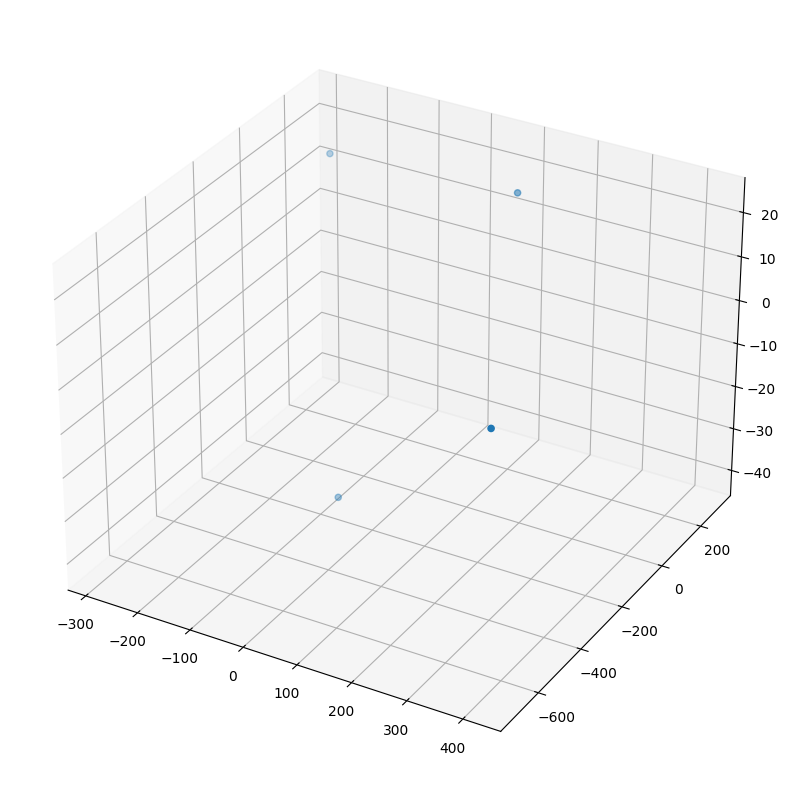

In [16]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler

word_vector_dictionary = {
    'cat': np.array([0.1, 0.2, 0.3, 0.4, 0.77]),
    'dog': np.array([0.1, 0.7, -0.2, -0.4, -0.2]),
    'fish': np.array([0.5, 0.2, 0.1, 0.4, .31]),
    'bird': np.array([0.3, 0.4, 0.2, 0.1, -.89]),
}

vectors = np.array(list(word_vector_dictionary.values()))
words = list(word_vector_dictionary.keys())

tsne = TSNE(n_components=3, random_state=0, perplexity = 2) # perplexity must be a value less than the number of samples. When you implement this, please leave it as its default (30) unless you have a good reason to change it.
results = tsne.fit_transform(vectors)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

ax.scatter(results[:, 0], results[:, 1], results[:, 2])

In [17]:
def keyedvector_to_dict(keyedvectors):
    return {word: keyedvectors[word] for word in keyedvectors.index_to_key}

def visualize_word_vectors(word_vectors, num_words=0):
    # if num_words is 0, show all words. Otherwise, show the first num_words words
    # Get the word vectors and words from the KeyedVectors object

    words = word_vectors.index_to_key[:num_words] if num_words>0 else word_vectors.index_to_key
    vectors = np.array([word_vectors[w] for w in words])

    # Create a TSNE object and fit it to the word vectors
    tsne = TSNE(n_components=3, random_state=0, perplexity = 5)
    results = tsne.fit_transform(vectors)

    # Create a 3D scatter plot of the word vectors
    fig = plt.figure(figsize=(8, 10))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(results[:, 0], results[:, 1], results[:, 2])

    # Annotate
    for i, word in enumerate(words):
        ax.text(results[i, 0], results[i, 1], results[i, 2], word, size=20, zorder=1)

    # Add labels to the points in the plot
    ax.set_xlabel('TSNE-1')
    ax.set_ylabel('TSNE-2')
    ax.set_zlabel('TSNE-3')

    # Show the plot
    plt.show()

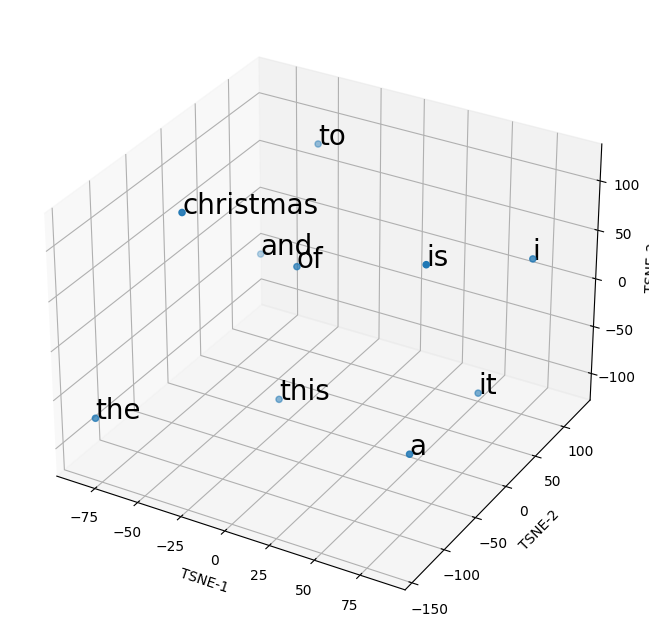

In [18]:
keyedvectors = KeyedVectors.load('P11_Q3_fasttext.wordvectors')
visualize_word_vectors(keyedvectors, 10) # visualize the first 10 words

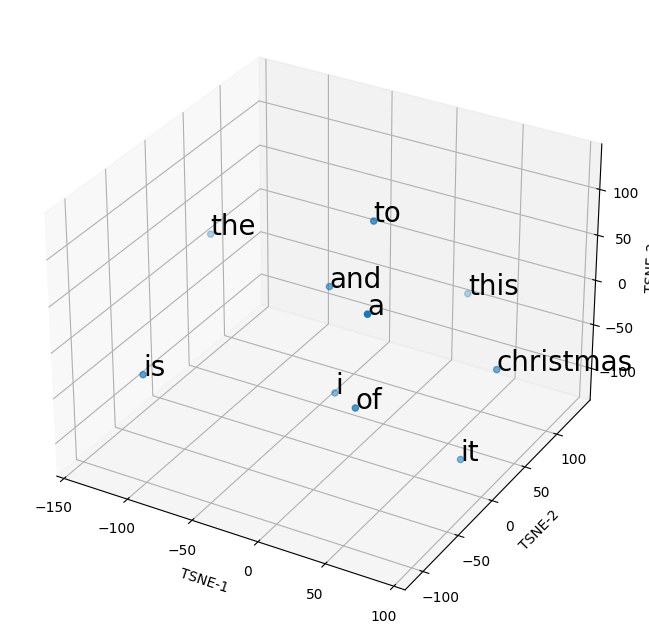

In [19]:
keyedvectors = KeyedVectors.load('P11_Q2_word2vec.wordvectors')
visualize_word_vectors(keyedvectors, 10) # visualize the first 10 words

FastText: The words are more spread out, with some groupings forming clusters (e.g., "christmas," "and," "of," "too"), showing that the FastText model might be capturing subtler relationships between words more effectively. The separation between words shows a clearer differentiation of function words.
Word2Vec: The words seem less grouped together, which could indicate a less refined representation of word relationships compared to FastText. FastText may work better for capturing word relationships, especially when considering the distance and clustering of words. 

## Question 5

In [20]:
import numpy as np
def cosine_similarity(word_vectors, word1, word2):
    # If a word is not present, return None
    if word1 not in word_vectors or word2 not in word_vectors:
        return None

    # get the word vectors
    vector1 = word_vectors[word1]
    vector2 = word_vectors[word2]

    # calculate the dot product
    dot_product = np.dot(vector1, vector2)

    # calculate the magnitudes
    magnitude1 = np.linalg.norm(vector1)
    magnitude2 = np.linalg.norm(vector2)

    # return the cosine similarity
    cosine_sim = dot_product / (magnitude1 * magnitude2)
    return cosine_sim

In [21]:
keyedvectors = KeyedVectors.load('P11_Q3_fasttext.wordvectors')
print(cosine_similarity(keyedvectors, 'cd', 'music'))
print(cosine_similarity(keyedvectors, 'cd', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'is'))
print(cosine_similarity(keyedvectors, 'a', 'dog'))
print(cosine_similarity(keyedvectors, 'july', 'christmas'))
print(cosine_similarity(keyedvectors, 'the', 'impressive'))

# should output:
'''
0.9998109
0.9998211
0.9999449
0.9999108
0.99883497
0.9999105
0.9999365
'''

0.9998109
0.9998211
0.9999449
0.9999108
0.99883497
0.9999105
0.9999365


'\n0.9998109\n0.9998211\n0.9999449\n0.9999108\n0.99883497\n0.9999105\n0.9999365\n'

In [22]:
n = 3000 # how many lines to read.
wv = generate_word_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', n, 0), f'P11_Q5_fasttext_{n}')
keyedvectors = KeyedVectors.load(f'P11_Q5_fasttext_{n}.wordvectors')
print(cosine_similarity(keyedvectors, 'cd', 'music'))
print(cosine_similarity(keyedvectors, 'cd', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'is'))
print(cosine_similarity(keyedvectors, 'a', 'dog'))
print(cosine_similarity(keyedvectors, 'july', 'christmas'))
print(cosine_similarity(keyedvectors, 'the', 'impressive'))

0.912108
0.9223433
0.9733235
0.9465208
0.56319916
0.6614903
0.93214566


In [23]:
n = 10000 # how many lines to read.
wv = generate_word_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', n, 0), f'P11_Q5_fasttext_{n}')
keyedvectors = KeyedVectors.load(f'P11_Q5_fasttext_{n}.wordvectors')
print(cosine_similarity(keyedvectors, 'cd', 'music'))
print(cosine_similarity(keyedvectors, 'cd', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'is'))
print(cosine_similarity(keyedvectors, 'a', 'dog'))
print(cosine_similarity(keyedvectors, 'july', 'christmas'))
print(cosine_similarity(keyedvectors, 'the', 'impressive'))

0.54179674
0.55386555
0.39748538
0.23915084
0.30011725
0.68445516
0.43907484


In [ ]:
n = 30000 # how many lines to read.
wv = generate_word_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', n, 0), f'P11_Q5_fasttext_{n}')
keyedvectors = KeyedVectors.load(f'P11_Q5_fasttext_{n}.wordvectors')
print(cosine_similarity(keyedvectors, 'cd', 'music'))
print(cosine_similarity(keyedvectors, 'cd', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'christmas'))
print(cosine_similarity(keyedvectors, 'a', 'is'))
print(cosine_similarity(keyedvectors, 'a', 'dog'))
print(cosine_similarity(keyedvectors, 'july', 'christmas'))
print(cosine_similarity(keyedvectors, 'the', 'impressive'))

The smaller datasets (n = 3000) has cosine similarity values that are higher because the model has a more concentrated set of words, leading to stronger similarities between commonly co-occurring terms. Larger datasets (n = 10000, n = 30000), the cosine similarity values decrease. The model introduces more contexts, which broadens the relationships and reduces the similarity between certain word pairs. This suggests that the model is now capturing more subtle differences in meaning and context.

# Project 12

## Question 1

In [13]:
def read_lines(file_path, n, start = 0):
    lines = []
    with open(file_path, 'r') as f: # open the file in read mode
        for i, line in enumerate(f):
            if i < start:
                continue
            lines.append(line.strip())
            if len(lines) == n:
                break
    return lines

import codecs
def clean_text(text):
    #modify the text here
    # 1) decode escape sequences
    # 2) remove the starting and ending double quotes
    # 3) replace any newlines with a space
    # 4) return the cleaned text

    text = codecs.decode(text, 'unicode_escape')
    text = text.replace('\n', ' ')
    text = text.lower()
    text = ''.join(c for c in text if c.isalpha() or c.isspace())
    return text

In [14]:
class NGram:
    def __init__(self, n, is_character_based=False):
        self.n = n
        self.data = None
        self.is_character_based = is_character_based
        self.ngrams = set()
        self.ngram_frequencies = {}
        self.ngram_probabilities = {}

    def set_data(self, data):
        cleaned_data = []
        for element in data:
            cleaned_line = clean_text(element)
            if self.is_character_based:
                cleaned_data.append(cleaned_line)
            else:
                word_tuple = tuple(cleaned_line.split())
                cleaned_data.append(word_tuple)
        self.data = cleaned_data

    def generate_ngrams(self):
        if not isinstance(self.data, list) or not self.data:
            self.ngram_frequencies = {}
            return self.ngram_frequencies

        frequency = {}  
        
        # Char
        if self.is_character_based:
            for text in self.data:
                for i in range(len(text) - self.n + 1):
                    gram = text[i:i+self.n]
                    frequency[gram] = frequency.get(gram, 0) + 1
        # Word
        else:
            for words in self.data:
                for i in range(len(words) - self.n + 1):
                    gram = words[i:i+self.n] 
                    frequency[gram] = frequency.get(gram, 0) + 1

        self.ngram_frequencies = frequency
        return frequency

    def generate_ngram_probabilities(self):
        frequency = self.generate_ngrams()
        if not isinstance(frequency, dict) or not frequency:
            self.ngram_probabilities = {}
            return self.ngram_probabilities
    
        prefix_counts = {}
        probabilities = {}
    
        for gram, count in frequency.items():
            if self.is_character_based:
                prefix = gram[:-1]  
                last = gram[-1]   
            else:
                prefix = gram[:-1]  
                last = gram[-1]   
            
            prefix_counts[prefix] = prefix_counts.get(prefix, 0) + count
            
            if prefix not in probabilities:
                probabilities[prefix] = {}
            probabilities[prefix][last] = probabilities[prefix].get(last, 0) + count
    
        for prefix, last_counts in probabilities.items():
            total = prefix_counts[prefix]
            for last, count in last_counts.items():
                last_counts[last] = count / total

        self.ngram_probabilities = probabilities
        return probabilities
        

    def get_next_word(self, previous_words, method='random'):
        if not self.ngram_probabilities or not isinstance(self.ngram_probabilities, dict):
            return ""
        
        if self.is_character_based:
            if len(previous_words) != self.n - 1:
                return ""
            prefix = previous_words
        else:
            tokens = previous_words.split()
            if len(tokens) != self.n - 1:
                return ""
            prefix = tuple(tokens)

        if prefix not in self.ngram_probabilities:
            return ""
            
        token_probs = self.ngram_probabilities[prefix]

        if method == 'random':
            tokens_list = list(token_probs.keys())
            probabilities = list(token_probs.values())
            choice = np.random.choice(tokens_list, p=probabilities)
            return str(choice)
        elif method == 'common':
            common_token = max(token_probs, key=lambda k: token_probs[k])
            return str(common_token)
        elif method == 'uncommon':
            uncommon_token = min(token_probs, key=lambda k: token_probs[k])
            return str(uncommon_token)
        else:
            tokens_list = list(token_probs.keys())
            probabilities = list(token_probs.values())
            choice = np.random.choice(tokens_list, p=probabilities)
            return str(choice)

    def get_perplexity(self, text):
        H = 2  
        if self.is_character_based:
            tokens = list(text)  
        else:
            tokens = text.split() 
        
        N = len(tokens)
        if N < self.n:
            return float('inf')
        
        log_prob_sum = 0.0
        for i in range(N - (self.n - 1)):
            if self.is_character_based:
                prefix = ''.join(tokens[i:i+self.n-1])
                token = tokens[i+self.n-1]
            else:
                prefix = tuple(tokens[i:i+self.n-1])
                token = tokens[i+self.n-1]
            
            if prefix in self.ngram_probabilities:
                prob = self.ngram_probabilities[prefix].get(token, 0.00001)
            else:
                prob = 0.00001

            log_prob = math.log(prob) / math.log(H)
            log_prob_sum += log_prob
        
        avg_neg_log_prob = - (log_prob_sum / N)
        perplexity = H ** avg_neg_log_prob
        return perplexity

In [15]:
def get_next_word_loop(start_string, n=10):
    # generate the next n words and output the final string
    global my_ngram
    result = start_string.strip()

    for _ in range(n):
        # get the next word using the n-gram model
        tokens = result.split()
        prefix = " ".join(tokens[-(my_ngram.n - 1):])
        next_word = my_ngram.get_next_word(prefix, method="common")

        # append the next word to the start_string, with a space in between
        result += " " + next_word

    # return the final string
    return result

In [16]:
import numpy as np
my_ngram = NGram(3, is_character_based=False)
my_ngram.set_data(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 50000))
my_ngram.generate_ngram_probabilities()

print(get_next_word_loop("this is a",5))

print(get_next_word_loop("this is a",20))

this is a great album and the music
this is a great album and the music is great and the music is great and the music is great and the music


this is a great album and the music
this is a great album and the music is great and the music is great and the music is great and the music

5-word sequence: The model produced a smooth, coherent phrase.
20-word sequence: Because we use method="common", the model is deterministic. It always picks the single most frequent continuation for each 2-word prefix. Once it falls into a high-frequency cycle (e.g. “the music is great and”), it loops there indefinitely.

## Question 2

In [17]:
from gensim.models import FastText, KeyedVectors
def generate_fasttext_vectors(lines, filename):
    # Clean the text using the clean_text function
    cleaned_lines = [clean_text(line) for line in lines]

    # Split each line into words using .split()
    tokenized_lines = [line.split() for line in cleaned_lines]

    # Create a Word2Vec model using the tokenized lines
    model = FastText(tokenized_lines, vector_size=100, window=5, min_count=1, workers=1)

    # Save the model to disk
    model.save(f'{filename}.model')

    # Save the word vectors to disk
    word_vectors = model.wv
    word_vectors.save(f'{filename}.wordvectors')

    return word_vectors

keyedvectors = generate_fasttext_vectors(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 5000, 0), 'P12_fasttext')

In [18]:
def create_dataset(data, word_embeddings, n=3):
    input_data = []
    output_data = []

    for line in data:
        # clean the line
        cleaned = clean_text(line)

        # split the line into words
        words = []
        words = cleaned.split()

        # if the number of words is less than n, skip the line
        if len(words) < n:
            continue

        # convert the list of words into a list of word embeddings
        embeddings = []
        embeddings = [word_embeddings[w] for w in words]

        # group the embeddings into groups of n consecutive words
        embedding_groups = []
        embedding_groups = [
            embeddings[i : i + n]
            for i in range(len(embeddings) - n + 1)
        ]


        r_i = []
        r_o = []

        # given our embedding group, append the first n-1 word embeddings to r_i, and the last word embedding to r_o
        # be sure to cast these to numpy arrays before appending them to the list
        for group in embedding_groups:
            r_i.append(np.array(group[:-1]))
            r_o.append(np.array(group[-1]))


        # append a numpy array of r_i to input_data, and r_o to output_data
        input_data.append(np.stack(r_i))
        output_data.append(np.stack(r_o))

    # return the list of words, embeddings, input_data, and output_data
    return (words, embeddings, input_data, output_data)

In [19]:
words, embeddings, input_dataset, output_data = create_dataset(read_lines('/anvil/projects/tdm/data/amazon/music.txt', 1500), keyedvectors, n=3)

print(input_dataset[0].shape) # (4, 2, 100), we have 4 sequences of 2 words, each with 100 dimensions
print(input_dataset[1].shape) # (2, 2, 100), we have 2 sequences of 2 words, each with 100 dimensions
print(input_dataset[2].shape) # (39, 2, 100), we have 39 sequences of 2 words, each with 100 dimensions
print(len(input_dataset)) # 1360, there are 1360 reviews that were long enough to be used
print(len(output_data)) # 1360, there are 1360 reviews that were long enough to be used

print(output_data[0][0][:5]) # [ 0.88376546  0.7545694  -0.9747805  -0.74862236  0.05938531]

print(input_dataset[10][0][0][:5]) # [-0.1334532   0.10588685 -2.6614566  -1.1856614   0.5889898 ]

print(output_data[8][0][:5]) # [ 0.4304928   0.8276741  -0.91861534 -0.3446058   0.46729067]

(4, 2, 100)
(2, 2, 100)
(39, 2, 100)
1360
1360
[ 0.88376546  0.7545694  -0.9747805  -0.74862236  0.05938531]
[-0.1334532   0.10588685 -2.6614566  -1.1856614   0.5889898 ]
[ 0.4304928   0.8276741  -0.91861534 -0.3446058   0.46729067]


(4, 2, 100)
(2, 2, 100)
(39, 2, 100)
1360
1360
[ 0.88376546  0.7545694  -0.9747805  -0.74862236  0.05938531]
[-0.1334532   0.10588685 -2.6614566  -1.1856614   0.5889898 ]
[ 0.4304928   0.8276741  -0.91861534 -0.3446058   0.46729067]

## Question 3

In [20]:
def cosine_similarity_vec(v1, v2):
    # find the cosine similarity between two vectors
    dot_product = np.dot(v1, v2)
    magnitude_v1 = np.linalg.norm(v1)
    magnitude_v2 = np.linalg.norm(v2)

    return dot_product / (magnitude_v1 * magnitude_v2)

def get_word_from_embedding(embedding, keyedvectors):
    # get a key: value pair of all the word embeddings in the keyedvectors object
    best_word = None
    best_sim = -1.0

    # for each word embedding in the keyedvectors object, calculate the cosine similarity to the given word embedding
    # find the word with the highest cosine similarity to the given word embedding
    for word in keyedvectors.key_to_index:
        vec = keyedvectors[word]
        sim = cosine_similarity_vec(embedding, vec)
        if sim > best_sim:
            best_sim = sim
            best_word = word

    # return the word with the highest cosine similarity
    return best_word, best_sim

In [21]:
print(words[0:10]) # ['great', 'video', 'you', 'are', 'taught', 'the', 'tricks', 'of', 'the', 'trade']
print([get_word_from_embedding(embeddings[i], keyedvectors) for i in range(10)])
# [('great', 0.9999999), ('video', 1.0), ('you', 1.0000001), ('are', 1.0000001), ('taught', 1.0), ('the', 1.0), ('tricks', 0.9999999), ('of', 1.0000001), ('the', 1.0), ('trade', 0.99999994)]

print(get_word_from_embedding(input_dataset[5][10][0], keyedvectors)) # should print ('still', 1.0)
print(get_word_from_embedding(input_dataset[5][11][0], keyedvectors)) # should print the word ('sounding', 0.99999994)
print(get_word_from_embedding(input_dataset[110][5][0], keyedvectors)) # should print the word ('rock', 1.0000001)

['great', 'video', 'you', 'are', 'taught', 'the', 'tricks', 'of', 'the', 'trade']
[('great', 0.9999999), ('video', 1.0), ('you', 1.0000001), ('are', 1.0000001), ('taught', 1.0), ('the', 1.0), ('tricks', 0.9999999), ('of', 1.0000001), ('the', 1.0), ('trade', 0.99999994)]
('still', 1.0)
('sounding', 0.99999994)
('rock', 1.0000001)


['great', 'video', 'you', 'are', 'taught', 'the', 'tricks', 'of', 'the', 'trade']
[('great', 0.9999999), ('video', 1.0), ('you', 1.0000001), ('are', 1.0000001), ('taught', 1.0), ('the', 1.0), ('tricks', 0.9999999), ('of', 1.0000001), ('the', 1.0), ('trade', 0.99999994)]
('still', 1.0)
('sounding', 0.99999994)
('rock', 1.0000001)

## Question 4

In [22]:
from torch import nn
from torch import optim
import torch
import time
class RNNModel(nn.Module):
    def __init__(self, input_size=100, hidden_size=128, output_size=100, input_sequence_length = 2): # our word embeddings are 100 dimensions, and we will use a hidden size of 128.
        super().__init__() # initialize the base class
        self.input_sequence_length = input_sequence_length # this is our input_sequence_length. We won't use it in the model, but you will use it to write your predict function in the next question.
        self.rnn = nn.RNN(input_size, hidden_size, batch_first=True) # create the RNN layer, using the input size and a hidden size. The batch_first = True parameter means that the input data will be in the format (batch_size, sequence_length, input_size). This is important because we will be using batches of data to train the model. Batches are used to essentially group data together to speed up training, but in this case we can use it to group our sequences together with a batch size of 1.
        self.fc = nn.Linear(hidden_size, output_size) # add a linear layer to the model, which will take the hidden layer and output the next word embedding. The output size is the same as the input size, because we want to output a word embedding that is the same size as the input word embedding.

    def forward(self, x, hidden): # this will take in the current input data and the hidden state, and return the output data and the updated hidden state.
        out, hidden = self.rnn(x, hidden) # get the output of the RNN layer, and update the hidden state
        out = self.fc(out[:, -1, :]) # pass the output of the RNN layer through the linear layer. The out[:, -1, :] means that we are only taking the last output of the RNN layer. Although this is only the last word from the sequence, since it has been passed through the RNN layer along with the hidden state the entire sequence should be encoded here.
        return out, hidden

    def train(self, input_data, output_data, num_epochs=5, learning_rate=0.001): # this function will train the model using our input and output data from question 2. Additionally, we can specify how many epochs to run and the learning rate of the model.

        criterion = nn.MSELoss() # use Mean Squared Error as the criterion
        optimizer = optim.Adam(self.parameters(), lr=learning_rate) # use Adaptive Moment Estimation (Adam) as the optimizer.

        # for each epoch
        for epoch in range(num_epochs):
            # set the loss of the epoch to 0
            total_loss = 0

            # for each review (pair of input and output data arrays for the review)
            s = time.time()

            for i, (r_i, r_o) in enumerate(zip(input_data, output_data)): # iterate through each review we have

                if i % 1000 == 0: # occasionally print the progress of the training, along with the elapsed time
                    print(f'Processing review {i+1}/{len(input_data)}')
                    print(f'Elapsed time: {time.time() - s} seconds')
                    s = time.time()

                # set `hidden_state` variable to None each review, as we want to reset the hidden state for each review
                hidden = None

                # for each sequence and output pair in the review
                for seq, o in zip(r_i, r_o):

                    # convert the sequence and output to tensors to be passed to the model
                    input_tensor = torch.tensor(seq, dtype=torch.float32).unsqueeze(1) # dimensions [2, 1, 100]
                    output_tensor = torch.tensor(o[0], dtype=torch.float32) # dimensions [100]

                    # set the optimizer to zero gradients using it's `zero_grad` function
                    optimizer.zero_grad()

                    # perform a forward pass of the model using the input tensor and hidden state, and get the output and updated hidden state
                    output, hidden = self(input_tensor, hidden)

                    output = output[-1, 0] # get the last output of the RNN layer, which is the output we want to use for the next word embedding

                    if hidden is not None:
                        hidden = hidden.detach() # We need to detach the hidden state from the graph so that it isn't updated with the gradients.

                    # calculate the loss using the criterion
                    loss = criterion(output, output_tensor)

                    # backpropogate the loss, using the `backward` function of the loss
                    loss.backward()

                    # step the optimizer, using the `step` function of the optimizer
                    optimizer.step()

                    # add loss.item() to the total loss for the epoch
                    total_loss += loss.item()


            # print the loss for the epoch
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(input_data)}')

        return total_loss/len(input_data)

In [23]:
# create the model
hidden_size = 128 # size of the hidden layer
output_size = 100 # size of the output layer
input_size = 100
# input size is the size of each input data, which is n word embeddings
model = RNNModel(input_size, hidden_size, output_size)

model.train(input_dataset, output_data, num_epochs=5, learning_rate=0.001) # train the model on the input and output data

Processing review 1/1360
Elapsed time: 4.7206878662109375e-05 seconds
Processing review 1001/1360
Elapsed time: 42.99123454093933 seconds
Epoch 1/5, Loss: 12.94634161159511
Processing review 1/1360
Elapsed time: 1.4543533325195312e-05 seconds
Processing review 1001/1360
Elapsed time: 42.70306921005249 seconds
Epoch 2/5, Loss: 12.844195898304122
Processing review 1/1360
Elapsed time: 9.059906005859375e-06 seconds
Processing review 1001/1360
Elapsed time: 42.693798542022705 seconds
Epoch 3/5, Loss: 12.75363436277198
Processing review 1/1360
Elapsed time: 8.821487426757812e-06 seconds
Processing review 1001/1360
Elapsed time: 42.55666208267212 seconds
Epoch 4/5, Loss: 12.71409871797836
Processing review 1/1360
Elapsed time: 9.059906005859375e-06 seconds
Processing review 1001/1360
Elapsed time: 42.564619302749634 seconds
Epoch 5/5, Loss: 12.742823552973302


12.742823552973302

Processing review 1/1360
Elapsed time: 4.7206878662109375e-05 seconds
Processing review 1001/1360
Elapsed time: 42.99123454093933 seconds
Epoch 1/5, Loss: 12.94634161159511
Processing review 1/1360
Elapsed time: 1.4543533325195312e-05 seconds
Processing review 1001/1360
Elapsed time: 42.70306921005249 seconds
Epoch 2/5, Loss: 12.844195898304122
Processing review 1/1360
Elapsed time: 9.059906005859375e-06 seconds
Processing review 1001/1360
Elapsed time: 42.693798542022705 seconds
Epoch 3/5, Loss: 12.75363436277198
Processing review 1/1360
Elapsed time: 8.821487426757812e-06 seconds
Processing review 1001/1360
Elapsed time: 42.55666208267212 seconds
Epoch 4/5, Loss: 12.71409871797836
Processing review 1/1360
Elapsed time: 9.059906005859375e-06 seconds
Processing review 1001/1360
Elapsed time: 42.564619302749634 seconds
Epoch 5/5, Loss: 12.742823552973302
12.742823552973302

## Question 5

In [28]:
def predict_from_string(input_string, model, keyedvectors):
    # clean the input string using the clean_text function
    cleaned = clean_text(input_string)

    # split the input string into words using .split()
    words = cleaned.split()

    # create a list of word embeddings for the input words using the keyedvectors object
    input_embeddings = []
    for w in words:
        if w in keyedvectors.key_to_index:
            input_embeddings.append(keyedvectors[w])

    # group the embeddings into groups of model.input_sequence_length consecutive words. n-grams
    embedding_groups = []
    for i in range(len(input_embeddings) - model.input_sequence_length + 1):
        embedding_groups.append(input_embeddings[i : i + model.input_sequence_length])

    hidden = None
    output = None

    # we need to start passing the entire sequence of word embeddings to the model to update the hidden state
    # once we have the hidden state for the entire sequence, then we can get the next word
    for seq in embedding_groups:

        input_tensor = torch.tensor(seq, dtype=torch.float32).unsqueeze(1)
        output, hidden = model(input_tensor, hidden)

        if hidden is not None:
            hidden = hidden.detach()

    # get the predicted word embedding
    predicted_embedding = output.detach().numpy()[1]

    # get the word with the highest cosine similarity to the predicted embedding, using your `get_word_from_embedding` function
    predicted_word, similarity = get_word_from_embedding(predicted_embedding, keyedvectors)

    return predicted_word,similarity

In [29]:
start_string = 'this is a wonderful cd and'
for i in range(7):
    newword = predict_from_string(start_string, model, keyedvectors) # this is the function you will implement in the next question
    print(newword)
    start_string += " " + newword[0]
print(start_string)

('iv', 0.2563947)
('ivy', 0.25629252)
('iv', 0.18873401)
('iv', 0.24495685)
('iv', 0.16314252)
('ivy', 0.23427948)
('iv', 0.19672185)
this is a wonderful cd and iv ivy iv iv iv ivy iv


('iv', 0.2563947)
('ivy', 0.25629252)
('iv', 0.18873401)
('iv', 0.24495685)
('iv', 0.16314252)
('ivy', 0.23427948)
('iv', 0.19672185)
this is a wonderful cd and iv ivy iv iv iv ivy iv

The model didnt work well. While it did produce output, the words (“iv”, “ivy”) are repeated in a loop. This shows the shallow training of both embeddings and the LSTM. It shows a very limited vocabulary coverage (only music‐specific tokens). It also could be that low MSE objective doesn’t directly optimize for meaningful next‐word choices.

No. The similarity scores hover around 0.16 – 0.26 and fluctuate with each step. They didnt steadily decline or went high, showing that although the LSTM carries a hidden state, it isn’t effectively remembering the earlier parts of the seed beyond a couple tokens.

## Question 6

In [25]:
import torch
from torch import nn, optim
import time

class LSTMModel(nn.Module):
    def __init__(self,
                 input_size=100,
                 hidden_size=128,
                 output_size=100,
                 input_sequence_length=2):
        super().__init__()
        self.input_sequence_length = input_sequence_length
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc   = nn.Linear(hidden_size, output_size)

    def forward(self, x, hidden=None):
        if hidden is None:
            out, hidden = self.lstm(x)
        else:
            out, hidden = self.lstm(x, hidden)
        out = self.fc(out[:, -1, :])
        return out, hidden

    def train(self, input_data, output_data,
        num_epochs=5, learning_rate=0.001):
        criterion = nn.MSELoss()
        optimizer = optim.Adam(self.parameters(), lr=learning_rate)

        for epoch in range(num_epochs):
            total_loss = 0
            s = time.time()

            for i, (r_i, r_o) in enumerate(zip(input_data, output_data)):
                if i % 1000 == 0:
                    print(f'Processing review {i+1}/{len(input_data)} '
                          f'– elapsed {time.time()-s:.1f}s')
                    s = time.time()

                hidden = None


                for seq, o in zip(r_i, r_o):
                    input_tensor = torch.tensor(seq, dtype=torch.float32).unsqueeze(1) 
                    output_tensor = torch.tensor(o[0], dtype=torch.float32)

                    optimizer.zero_grad()

                    # perform a forward pass of the model using the input tensor and hidden state, and get the output and updated hidden state
                    output, hidden = self(input_tensor, hidden)

                    output = output[-1, 0] 

                    if hidden is not None:
                        hidden = (hidden[0].detach(), hidden[1].detach()) # We need to detach the hidden state from the graph so that it isn't updated with the gradients.

                    # calculate the loss using the criterion
                    loss = criterion(output, output_tensor)

                    # backpropogate the loss, using the `backward` function of the loss
                    loss.backward()

                    # step the optimizer, using the `step` function of the optimizer
                    optimizer.step()

                    # add loss.item() to the total loss for the epoch
                    total_loss += loss.item()

            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(input_data)}')

        return total_loss/len(input_data)

In [26]:
def predict_from_string(input_string, model, keyedvectors):
    # clean the input string using the clean_text function
    cleaned = clean_text(input_string)

    # split the input string into words using .split()
    words = cleaned.split()

    # create a list of word embeddings for the input words using the keyedvectors object
    input_embeddings = []
    for w in words:
        if w in keyedvectors.key_to_index:
            input_embeddings.append(keyedvectors[w])

    # group the embeddings into groups of model.input_sequence_length consecutive words. n-grams
    embedding_groups = []
    for i in range(len(input_embeddings) - model.input_sequence_length + 1):
        embedding_groups.append(input_embeddings[i : i + model.input_sequence_length])

    hidden = None
    output = None

    # we need to start passing the entire sequence of word embeddings to the model to update the hidden state
    # once we have the hidden state for the entire sequence, then we can get the next word
    for seq in embedding_groups:

        input_tensor = torch.tensor(seq, dtype=torch.float32).unsqueeze(1)
        output, hidden = model(input_tensor, hidden)

        if hidden is not None:
            hidden = (hidden[0].detach(), hidden[1].detach())

    # get the predicted word embedding
    predicted_embedding = output.detach().numpy()[1]

    # get the word with the highest cosine similarity to the predicted embedding, using your `get_word_from_embedding` function
    predicted_word, similarity = get_word_from_embedding(predicted_embedding, keyedvectors)

    return predicted_word, similarity

In [27]:
# create the model
hidden_size = 128 # size of the hidden layer
output_size = 100 # size of the output layer
input_size = 100
# input size is the size of each input data, which is n word embeddings
modellstm = LSTMModel(input_size, hidden_size, output_size)

modellstm.train(input_dataset, output_data, num_epochs=5, learning_rate=0.001) # train the model on the input and output data

Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.1s
Epoch 1/5, Loss: 11.409574087085927
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.8s
Epoch 2/5, Loss: 11.144177572684612
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.2s
Epoch 3/5, Loss: 11.068603830312114
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.3s
Epoch 4/5, Loss: 11.004212479000213
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.5s
Epoch 5/5, Loss: 10.966161499852504


10.966161499852504

Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.1s
Epoch 1/5, Loss: 11.409574087085927
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.8s
Epoch 2/5, Loss: 11.144177572684612
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.2s
Epoch 3/5, Loss: 11.068603830312114
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.3s
Epoch 4/5, Loss: 11.004212479000213
Processing review 1/1360 – elapsed 0.0s
Processing review 1001/1360 – elapsed 66.5s
Epoch 5/5, Loss: 10.966161499852504
10.966161499852504

In [31]:
start_string = 'this is a wonderful cd and'
for i in range(15):
    newword = predict_from_string(start_string, modellstm, keyedvectors)
    print(newword)
    start_string += " " + newword[0]
print(start_string)

('jp', 0.21184392)
('sd', 0.30169448)
('sd', 0.33159414)
('sd', 0.31818563)
('sd', 0.29211515)
('sd', 0.2545425)
('sd', 0.1999301)
('qv', 0.17216234)
('qv', 0.20793879)
('qv', 0.22718933)
('qv', 0.23966084)
('qv', 0.24988803)
('qv', 0.25620335)
('qv', 0.25752893)
('qv', 0.25642422)
this is a wonderful cd and jp sd sd sd sd sd sd qv qv qv qv qv qv qv qv


('jp', 0.21184392)
('sd', 0.30169448)
('sd', 0.33159414)
('sd', 0.31818563)
('sd', 0.29211515)
('sd', 0.2545425)
('sd', 0.1999301)
('qv', 0.17216234)
('qv', 0.20793879)
('qv', 0.22718933)
('qv', 0.23966084)
('qv', 0.24988803)
('qv', 0.25620335)
('qv', 0.25752893)
('qv', 0.25642422)
this is a wonderful cd and jp sd sd sd sd sd sd qv qv qv qv qv qv qv qv

Not really. Although it did produce a “next-word” each time, the outputs ('jp', 'sd's and 'qv's) are essentially meaningless. It just looks like a random cycle through a few high-frequency vectors in the embedding/model setup.

The similarity peaks quickly (by the 3rd token) then drops off, bottoms out around the 8th token, and then creeps back up as it cycles through the same few outputs. It does not steadily hold a high similarity over 15 predictions, so it’s essentially losing coherent context after just a handful of words.

RNN quickly fell into short loops of “iv/ivy/…” in the earlier tests. LSTM here similarly collapses into loops (“sd”, then “qv”), with no real sentence structure. At this small scale (5 epochs), the LSTM did not produce appreciably more coherent text than the RNN. It needs more data, deeper training, and tuning.

LSTM definitely takes longer to train compared to RNN. LSTM also has roughly 4× the internal parameters per cell (input, forget, output, and gate) compared to an RNN.

# Project 13

## Question 1

In [1]:
def read_lines(file_path, n, start = 0):
    lines = []
    with open(file_path, 'r') as f: # open the file in read mode
        for i, line in enumerate(f):
            if i < start:
                continue
            lines.append(line.strip())
            if len(lines) == n:
                break
    return lines

import codecs
def clean_text(text):
    #modify the text here
    # 1) decode escape sequences
    # 2) remove the starting and ending double quotes
    # 3) replace any newlines with a space
    # 4) return the cleaned text

    text = codecs.decode(text, 'unicode_escape')
    text = text.replace('\n', ' ')
    text = text.lower()
    text = ''.join(c for c in text if c.isalpha() or c.isspace())


    return text

In [2]:
def build_vocab(lines):
    token_to_idx = {} # dictionary to map tokens to indices
    idx_to_token = [] # list to store the tokens in order of their indices

    for line in lines:
        for token in clean_text(line).split():
            '''Add the token to token_to_idx if it is not already present, giving it the next index as its value'''
            if token not in token_to_idx:        
                idx = len(idx_to_token)          
                token_to_idx[token] = idx
                idx_to_token.append(token)
    return token_to_idx, idx_to_token

In [3]:
def generate_dataset(lines, token_to_idx, sequence_length):
    inputs = [] # list to store the input sequences
    outputs = [] # list to store the output sequences
    for line in lines:
        ''' Clean the text and split it into words'''
        split_text = clean_text(line).split()


        ''' Check if the number of words is less than sequence_length + 1, if so, skip the review'''
        if len(split_text) < sequence_length + 1:
            continue


        ''' Convert the list of words to the list of indices'''
        tokens = [token_to_idx[w] for w in split_text if w in token_to_idx]

        ''' Create the input/output pairs by iterating through the list of indices and creating sequences of length sequence_length'''
        for i in range(len(tokens) - sequence_length):
            ''' Append the input sequence to inputs and the output word to targets'''
            inputs.append(tokens[i : i + sequence_length])    
            ''' Append the input sequence to inputs and the output word to targets'''
            outputs.append(tokens[i + sequence_length]) 

    return inputs, outputs

In [4]:
sequence_len = 3

lines = read_lines('/anvil/projects/tdm/data/amazon/music.txt', 500)

token_to_idx, idx_to_token = build_vocab(lines)

inputs, outputs = generate_dataset(lines, token_to_idx, sequence_len)

print(f'Length of Inputs {len(inputs)}') # Should output 'Length of Inputs 11095'
print(f'CD Index: {token_to_idx.get("cd",None)}') # Should output 'CD Index: 3'

Length of Inputs 11095
CD Index: 3


Length of Inputs 11095
CD Index: 3

## Question 2

In [5]:
import torch
import math
def positional_encoding(seq_len, model_dimensions):
    ''' Create an tensor of zeros with shape (seq_len, model_dimensions)'''
    pe = torch.zeros(seq_len, model_dimensions)

    ''' Create an tensor of positions with shape (seq_len, 1), then unsqueeze it to dimensions (seq_len, 1)'''
    position = torch.arange(0, seq_len, dtype=torch.float32).unsqueeze(1)

    ''' Create an tensor of the division term.
    Torch does not have a 10000^x function, so instead we can represent 10000^x = e^(log(10000) * x) using torch.exp and math.log.
    Similarly, we can use e^(-log(10000) * x) to get 1/(10000^(x)), allowing us to multiply the position by the division term later for faster computation.
    hint: use torch.arange(0, model_dimensions, 2) to get the even indices of model dimensions'''
    div_term = torch.exp(torch.arange(0, model_dimensions, 2, dtype=torch.float32)
        * (-math.log(10000.0) / model_dimensions)
    )

    ''' Set the even indices of positional encodings by taking the sine of the position * div_term'''
    pe[:, 0::2] = torch.sin(position * div_term)

    ''' Set the odd indices of positional encodings by taking the cosine of the position * div_term'''
    pe[:, 1::2] = torch.cos(position * div_term)

    ''' Return the positional encodings'''
    return pe.unsqueeze(0)  # [1, seq_len, model_dimensions]

In [6]:
pe = positional_encoding(10, 4)
print(pe.shape) # Should output `torch.Size([1, 10, 4])`
print(pe[0, 0, :]) # Should output `tensor([0., 1., 0., 1.])`
print(pe[0, 1, :]) # Should output `tensor([0.8415, 0.5403, 0.0100, 0.9999])`
print(pe[0, 2, :]) # Should output `tensor([ 0.9093, -0.4161,  0.0200,  0.9998])`
print(pe[0, 3, :]) # Should output `tensor([ 0.1411, -0.9900,  0.0300,  0.9996])`
print(pe[0, 4, :]) # Should output `tensor([-0.7568, -0.6536,  0.0400,  0.9992])`
print(pe[0, 5, :]) # Should output `tensor([-0.9589,  0.2837,  0.0500,  0.9988])`

torch.Size([1, 10, 4])
tensor([0., 1., 0., 1.])
tensor([0.8415, 0.5403, 0.0100, 0.9999])
tensor([ 0.9093, -0.4161,  0.0200,  0.9998])
tensor([ 0.1411, -0.9900,  0.0300,  0.9996])
tensor([-0.7568, -0.6536,  0.0400,  0.9992])
tensor([-0.9589,  0.2837,  0.0500,  0.9988])


torch.Size([1, 10, 4])
tensor([0., 1., 0., 1.])
tensor([0.8415, 0.5403, 0.0100, 0.9999])
tensor([ 0.9093, -0.4161,  0.0200,  0.9998])
tensor([ 0.1411, -0.9900,  0.0300,  0.9996])
tensor([-0.7568, -0.6536,  0.0400,  0.9992])
tensor([-0.9589,  0.2837,  0.0500,  0.9988])

## Question 3

In [7]:
class MultiHeadAttention(torch.nn.Module):
    def __init__(self, model_dimensions, num_heads):
        super().__init__()

        '''Make sure that the model dimensions are divisible by the number of heads'''
        if model_dimensions % num_heads != 0:
            raise ValueError(
                f"model_dimensions ({model_dimensions}) must be divisible by "
                f"num_heads ({num_heads})."
            )

        '''Calculate d_k, the size of each head'''
        self.d_k = model_dimensions // num_heads

        ''' Store the number of heads'''
        self.num_heads = num_heads

        '''
        Create query, key, value linear layers
        The shape of this linear layer should be (model_dimensions, model_dimensions * 3) to create the query, key, and value vectors
        '''
        self.qkv = torch.nn.Linear(model_dimensions, model_dimensions * 3)

        '''
        Create Linear layer to combine the output of all heads
        The shape of this linear layer should be (model_dimensions, model_dimensions) to combine the output of all heads
        '''
        self.fc_out = torch.nn.Linear(model_dimensions, model_dimensions)

    def forward(self, x):
        '''x is the input tensor of shape (batch_size, seq_len, model_dimensions)'''

        '''
        B = batch size, T = sequence length, C = model dimensions
        This will essentially unpack the input tensor into 3 tensors of shape (B, T, d_k) for each head
        '''
        B, T, C = x.size()

        '''
        pass the input through the linear layer to get the query, key, and value vectors. Then, reshape the output to shape (B, T, 3, num_heads, d_k) and permute it to shape (3, B, num_heads, T, d_k)
        '''
        qkv = self.qkv(x).reshape(B, T, 3, self.num_heads, self.d_k).permute(2, 0, 3, 1, 4)

        '''
        we can then unpack the query, key, and value vectors from the qkv tensor simply by indexing the 0th, 1st, and 2nd elements of the tensor respectively
        '''
        q = qkv[0]
        k = qkv[1]
        v = qkv[2]

        '''
        q, k, v are now of shape (B, num_heads, T, d_k)
        This let's us compute the attention scores by taking the dot product of the query and key vectors, and then dividing by the square root of d_k to prevent large values in the softmax function
        '''
        scores = (q @ k.transpose(-2, -1)) / math.sqrt(self.d_k)

        '''
        We can apply the softmax function to the scores to get the attention weights. This will give us a tensor of shape (B, num_heads, T, T) where each row is the attention weights for each token in the sequence.
        Simply the scores softmax across dim=-1 (the last dimension)
        '''
        attn = scores.softmax(dim=-1)

        '''Next, we can compute the dot product of the attention weights and the value vectors to get the output of the attention mechanism, giving us tensor of shape (B, num_heads, T, d_k)
        '''
        out = (attn @ v).transpose(1, 2).reshape(B, T, C)

        '''
        Finally, we pass the output through the linear layer to combine the output of all heads and return the final output
        This will give us a tensor of shape (B, T, model_dimensions)
        '''
        return self.fc_out(out)

In [9]:
import numpy as np
import random

b = 2
t = 5
c = 128 # model dimensions
h = 4 # number of heads
mha = MultiHeadAttention(c,h)

torch.manual_seed(78)
np.random.seed(78)
random.seed(78)

x = np.random.rand(b,t,c).astype('f')

x = torch.from_numpy(x)
y = mha(x)
print(y.shape) # Should output `torch.Size([2, 5, 128])`

print(y[0][0][:10]) # Should output `tensor([ 0.0025, -0.0003,  0.0090,  0.0806, -0.0298,  0.0728, -0.3190, -0.2450, -0.0025, -0.1722], grad_fn=<SliceBackward0>)`

torch.Size([2, 5, 128])
tensor([ 0.0025, -0.0003,  0.0090,  0.0806, -0.0298,  0.0728, -0.3190, -0.2450,
        -0.0025, -0.1722], grad_fn=<SliceBackward0>)


torch.Size([2, 5, 128])
tensor([ 0.0025, -0.0003,  0.0090,  0.0806, -0.0298,  0.0728, -0.3190, -0.2450,
        -0.0025, -0.1722], grad_fn=<SliceBackward0>)

## Question 4

In [10]:
import torch
import torch.nn as nn
class TransformerBlock(torch.nn.Module):
    def __init__(self, model_dimensions, num_heads, attention_class=MultiHeadAttention):

        super().__init__()
        '''Create the attention mechanism, using whatever class is passed in as the attention_class, using the model dimensions and number of heads'''
        self.attn = attention_class(model_dimensions, num_heads)

        '''Create the first normalization layer, using the model dimensions with torch.nn.LayerNorm'''

        self.norm1 = nn.LayerNorm(model_dimensions)

        '''Create the feed-forward layer. This is done using torch.nn.Sequential, creating a Sequential model, that has a Linear layer with dimensions (model_dimensions, 4 * model_dimensions), followed by a ReLU activation, followed by another Linear layer with dimensions (4 * model_dimensions, model_dimensions)'''

        self.ff = nn.Sequential(
            nn.Linear(model_dimensions, 4 * model_dimensions),
            nn.ReLU(),
            nn.Linear(4 * model_dimensions, model_dimensions),
        )

        '''Create the second normalization layer, using the model dimensions'''
        self.norm2 = nn.LayerNorm(model_dimensions)

    def forward(self, x):
        '''Add the attention output to the input'''
        x = x + self.attn(x)

        '''Apply the first normalization layer to the x, saving it back into x'''
        x = self.norm1(x)

        '''Add the feed-forward of x to x'''
        x = x + self.ff(x)

        '''Apply the second normalization layer to the x, saving it back into x'''
        x = self.norm2(x)

        '''Return the final output'''
        return x

In [11]:
class MiniLLM(torch.nn.Module):
    def __init__(self, vocab_size, model_dimensions=128, num_heads=4, num_layers=2, seq_len=10, attention_class=MultiHeadAttention):
        super().__init__()

        '''Create the embedding layer, using the vocab size and model dimensions'''
        self.embed = nn.Embedding(vocab_size, model_dimensions)

        '''Generate the positional encodings using the positional_encoding function, using the sequence length and model dimensions'''
        self.pe = positional_encoding(seq_len, model_dimensions)

        '''Create the transformer blocks, using the TransformerBlock class, using the model dimensions and number of heads'''
        transformer_blocks = []
        for _ in range(num_layers):
            # append a new TransformerBlock to the transformer_blocks list
            transformer_blocks.append(
                TransformerBlock(
                    model_dimensions,
                    num_heads,
                    attention_class=attention_class,
                )
            )
        self.transformer_blocks = torch.nn.Sequential(*transformer_blocks) # create a Sequential model from the transformer_blocks list, unpacking it

        '''Create the final linear layer, using the model dimensions and vocab size'''

        self.fc = nn.Linear(model_dimensions, vocab_size)

    def forward(self, x):
        '''Set x equal to the embedding of x + the positional encodings'''
        positional_encodings = self.pe[:, :x.size(1), :]
        x = self.embed(x) + positional_encodings

        '''Pass x through the transformer blocks'''
        x = self.transformer_blocks(x)

        '''Extract the last time step of the output sequence'''
        x = x[:, -1, :]

        '''Pass x through the final linear layer'''
        x = self.fc(x)

        return x

## Question 5

In [12]:
from tqdm.auto import tqdm

def train_model(model, inputs, targets, epochs=5, learning_rate=1e-3, device="cpu"):
    '''Create the Adam optimizer using the model parameters and learning rate'''
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    '''Create the CrossEntropyLoss function'''
    loss_fn = torch.nn.CrossEntropyLoss()

    '''Iterate through each epoch'''
    for epoch in tqdm(range(epochs), desc='Training Epochs'):
        total_loss = 0
        '''In each epoch, zip the input and output sequences together and iterate through them'''
        for i, (x, y) in tqdm(enumerate(zip(inputs, targets)), desc=f'Training Epoch {epoch+1}', total=len(inputs), leave=False):
            '''Create a tensor for the input and output sequences, using [x] and [y] to create a batch of size 1'''
            x_tensor = torch.tensor([x], dtype=torch.long, device=device)
            y_tensor = torch.tensor([y], dtype=torch.long, device=device)

            '''Pass the input tensor through the model'''
            output = model(x_tensor)

            '''Calculate the loss by passing the model predictions and output sequences through the loss function'''
            loss = loss_fn(output, y_tensor)

            '''Zero the gradients by calling optimizer.zero_grad()'''
            optimizer.zero_grad()

            '''Backpropagate the loss by calling loss.backward()'''
            loss.backward()

            '''Step the optimizer by calling optimizer.step()'''
            optimizer.step()

            ''' Add loss.item() to the total loss'''
            total_loss += loss.item()

In [13]:
import torch.nn.functional as F
def generate_text(model, start_sequence, token_to_idx, idx_to_token, length=20, context_length=10, temperature=1.0):
    '''Set the model to evaluation mode'''
    model.eval()

    '''Convert the start sequence to a list of indices using the token_to_idx dictionary'''
    current = [token_to_idx[token] for token in start_sequence.split()]

    '''For each token to generate, do the following'''
    for _ in range(length):
        '''Create a tensor of length context length'''
        x = torch.tensor([current[-context_length:]], dtype=torch.long)

        '''Pass the tensor through the model'''
        with torch.no_grad():
            '''Get the model predictions by passing the input sequences through the model'''
            logits = model(x)

            '''Get the next token by sampling from the model predictions using torch.multinomial'''
            next_token = torch.multinomial(F.softmax(logits / temperature, dim=-1).squeeze(), num_samples=1).item()

            '''Append the next token to the current sequence'''
            current.append(next_token)
            
    return ' '.join(idx_to_token[i] for i in current)

In [14]:
context_length = 10

lines = read_lines('/anvil/projects/tdm/data/amazon/music.txt', 500)

token_to_idx, idx_to_token = build_vocab(lines)

inputs, outputs = generate_dataset(lines, token_to_idx, context_length)

vocab_size = len(token_to_idx)

model = MiniLLM(vocab_size, model_dimensions=128, num_heads=4, num_layers=2, seq_len=context_length, attention_class=MultiHeadAttention)

print('Start training....')

train_model(model, inputs, outputs, epochs=10, learning_rate=0.001)

print("Finished training!\nGenerating text...")

prompt = "this cd is the best because "
output = generate_text(model, prompt, token_to_idx, idx_to_token, length=20, context_length=context_length, temperature=0.8) # generate 20 words of text

print(f"Prompt: {prompt}")
print(f"Output: {output}")

Start training....


Training Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 2:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 3:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 4:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 5:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 6:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 7:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 8:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 9:   0%|          | 0/8763 [00:00<?, ?it/s]

Training Epoch 10:   0%|          | 0/8763 [00:00<?, ?it/s]

Finished training!
Generating text...
Prompt: this cd is the best because 
Output: this cd is the best because and i only arrived but gave the i into to i a christmas the first fan in i to i


In [15]:
context_length = 25

lines = read_lines('/anvil/projects/tdm/data/amazon/music.txt', 500)

token_to_idx, idx_to_token = build_vocab(lines)

inputs, outputs = generate_dataset(lines, token_to_idx, context_length)

vocab_size = len(token_to_idx)

model = MiniLLM(vocab_size, model_dimensions=128, num_heads=4, num_layers=2, seq_len=context_length, attention_class=MultiHeadAttention)

print('Start training....')

train_model(model, inputs, outputs, epochs=10, learning_rate=0.001)

print("Finished training!\nGenerating text...")

prompt = "this cd is the best because "
output = generate_text(model, prompt, token_to_idx, idx_to_token, length=50, context_length=context_length, temperature=0.5) # generate 20 words of text

print(f"Prompt: {prompt}")
print(f"Output: {output}")

Start training....


Training Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 2:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 3:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 4:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 5:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 6:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 7:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 8:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 9:   0%|          | 0/5326 [00:00<?, ?it/s]

Training Epoch 10:   0%|          | 0/5326 [00:00<?, ?it/s]

Finished training!
Generating text...
Prompt: this cd is the best because 
Output: this cd is the best because the album the for the the i the to just for it the a for the the to the is that the and i a for the of to as one of the in but it the the it the the and i the it singing the in the it


Increasing the context length decreased the training time. Lower temperature makes sampling more conservative. It almost always picks the highest-probability words, which explains why the word 'the' kept repeating. Increasing generation sample, increased thenrepetition.